<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>
    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>
        <table style="border-style:hidden;border-collapse:collapse;">             <tr>
                <td  style="border: none!important;">
                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#045F5F"> <b>Armin Ghasemi</b><br><br>810100198</i></font></h1>
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#045F5F"> <b>deep learning </b><br><br>HW_E Q2</i></font></h1>
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#045F5F"> <b>Amirhossein samoudi </b><br><br>810100108</i></font></h1>
                </td>
                <td style="border: none!important;">
                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
                </td>
           </tr>
        </table>
    </div>
</div>


### imports

In [2]:
!pip install hazm
!pip install arabic-reshaper
!pip install python-bidi
!pip install torchinfo -q

from IPython.display import display, HTML
from torchinfo import summary
import multiprocessing
import gdown
from google.colab import drive
import zipfile
import os
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd
from PIL import Image
import arabic_reshaper
from bidi.algorithm import get_display
import re
import numpy as np
import cv2
from tqdm import tqdm
from collections import Counter
from hazm import Normalizer, word_tokenize
import seaborn as sns
import h5py
import random
import shutil
import time
import torch
from nltk.translate.bleu_score import sentence_bleu
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from nltk.translate.bleu_score import corpus_bleu
from joblib import Parallel, delayed
import math

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.9/292.9 kB 7.3 MB/s eta 0:00:00


### mount drive

In [3]:
drive.mount('/content/drive')
#drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


### Data preparation

In [4]:
# ==============================================================================
# FINAL, UNIFIED, DRIVE-FREE PREPROCESSING SCRIPT
# ==============================================================================

# --- Step 1: Download and Extract Dataset Locally ---
print("--- Step 1: Downloading and Extracting Dataset ---")
zip_url = "https://drive.google.com/uc?id=11czApy91ADTgInmLq4b3SYh8QvA-QVEW"
local_zip_path = "/content/dataset.zip"
local_extract_path = "/content/dataset/"

# Download the file
gdown.download(zip_url, local_zip_path, quiet=False)

# Create extraction folder and unzip
os.makedirs(local_extract_path, exist_ok=True)
with zipfile.ZipFile(local_zip_path, 'r') as zip_ref:
    zip_ref.extractall(local_extract_path)
print(f"✅ Dataset extracted to {local_extract_path}")


# --- Step 2: Configuration (All paths are local) ---
print("\n--- Step 2: Configuring Paths ---")

# Input paths (now local)
RAW_IMAGE_DIR = os.path.join(local_extract_path, 'dataset/images/')
RAW_CSV_PATH = os.path.join(local_extract_path, 'dataset/data.csv')

# Final output paths (also local)
FINAL_IMAGE_DIR = '/content/extracted_images/'
FINAL_NPZ_PATH = '/content/captions_and_vocab.npz'

# Create final output directory
os.makedirs(FINAL_IMAGE_DIR, exist_ok=True)

# Processing Parameters
TARGET_IMAGE_SIZE = (224, 224)
VOCAB_THRESHOLD = 3
NUM_SAMPLES_TO_PROCESS = None # Set to a number for testing, or None for all

# --- Step 3: Text Preprocessing and Vocabulary Building ---
print("\n--- Step 3: Processing Text and Building Vocabulary ---")

df = pd.read_csv(RAW_CSV_PATH)

if NUM_SAMPLES_TO_PROCESS is not None:
    print(f"--- Running in test mode: Processing {NUM_SAMPLES_TO_PROCESS} samples. ---")
    df = df.head(NUM_SAMPLES_TO_PROCESS).copy()

normalizer = Normalizer(correct_spacing=False)
def clean_tokenize_caption(text):
    text = str(text)
    text = normalizer.normalize(text)
    punc_to_remove = r'[_،,;.?!:"\'«»()\[\]{}<>/\\-]'
    text = re.sub(punc_to_remove, ' ', text)
    text = re.sub(r'[^\u0600-\u06FF\u0030-\u0039\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return word_tokenize(text)

df['tokenized_caption'] = df['text'].apply(clean_tokenize_caption)

all_tokens = [token for tokens_list in df['tokenized_caption'] for token in tokens_list]
word_counts = Counter(all_tokens)
words_in_vocab = [word for word, count in word_counts.items() if count >= VOCAB_THRESHOLD]
word2idx = {'<pad>': 0, '<start>': 1, '<end>': 2, '<unk>': 3}
for i, word in enumerate(words_in_vocab):
    word2idx[word] = i + 4
idx2word = {idx: word for word, idx in word2idx.items()}
print(f"✅ Vocabulary created with {len(word2idx)} words.")


# --- Step 4: Image Preprocessing and Final Saving (Parallel) ---

# Helper function for resizing
def preprocess_and_save_image(image_name, source_dir, dest_dir, target_size):
    source_path = os.path.join(source_dir, image_name)
    try:
        img = cv2.imread(source_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # This version squashes the image to the target size
        # It's faster and simpler than padding for this unified script
        resized_img = cv2.resize(img, target_size, interpolation=cv2.INTER_CUBIC)

        # Save the processed image directly as a JPEG
        dest_path = os.path.join(dest_dir, image_name)
        # Convert back to BGR for cv2.imwrite if needed, or use PIL
        cv2.imwrite(dest_path, cv2.cvtColor(resized_img, cv2.COLOR_RGB2BGR))
        return True # Indicate success
    except Exception as e:
        # print(f"Skipping image {image_name} due to error: {e}")
        return False # Indicate failure

# Helper function for the main parallel task
def process_single_item(row, word2idx_dict):
    image_name, tokens = row['image'], row['tokenized_caption']

    # Process and save the image, get success status
    success = preprocess_and_save_image(image_name, RAW_IMAGE_DIR, FINAL_IMAGE_DIR, TARGET_IMAGE_SIZE)

    if success:
        caption_indices = [word2idx_dict['<start>']]
        caption_indices.extend([word2idx_dict.get(token, word2idx_dict['<unk>']) for token in tokens])
        caption_indices.append(word2idx_dict['<end>'])
        return caption_indices, image_name
    return None

print("\n--- Step 4: Processing images in parallel and saving directly... ---")

# Use joblib to process all items. This is the main time-consuming step.
results = Parallel(n_jobs=-1)(
    delayed(process_single_item)(row, word2idx)
    for _, row in tqdm(df.iterrows(), total=df.shape[0], desc="Processing Data")
)

# Filter out failed items
results = [res for res in results if res is not None]
final_captions, final_image_names = zip(*results)

# --- Step 5: Save Final Caption and Vocabulary Data ---
print(f"\n--- Step 5: Saving {len(final_captions)} captions and vocabularies... ---")

np.savez_compressed(
    FINAL_NPZ_PATH,
    captions=np.array(final_captions, dtype=object),
    word2idx=word2idx,
    idx2word=idx2word,
    image_names=np.array(final_image_names)
)

print("\n\n✅✅✅ PREPROCESSING FINISHED SUCCESSFULLY! ✅✅✅")
print(f"Your final data is ready in:")
print(f"-> Images: {FINAL_IMAGE_DIR}")
print(f"-> Captions & Vocab: {FINAL_NPZ_PATH}")

--- Step 1: Downloading and Extracting Dataset ---


Downloading...
From (original): https://drive.google.com/uc?id=11czApy91ADTgInmLq4b3SYh8QvA-QVEW
From (redirected): https://drive.google.com/uc?id=11czApy91ADTgInmLq4b3SYh8QvA-QVEW&confirm=t&uuid=c835e431-68a1-44fa-8bd6-a4097705dad0
To: /content/dataset.zip
100%|██████████| 1.89G/1.89G [00:25<00:00, 74.0MB/s]


✅ Dataset extracted to /content/dataset/

--- Step 2: Configuring Paths ---

--- Step 3: Processing Text and Building Vocabulary ---
✅ Vocabulary created with 3992 words.

--- Step 4: Processing images in parallel and saving directly... ---


Processing Data: 100%|██████████| 40000/40000 [01:49<00:00, 364.37it/s]



--- Step 5: Saving 40000 captions and vocabularies... ---


✅✅✅ PREPROCESSING FINISHED SUCCESSFULLY! ✅✅✅
Your final data is ready in:
-> Images: /content/extracted_images/
-> Captions & Vocab: /content/captions_and_vocab.npz


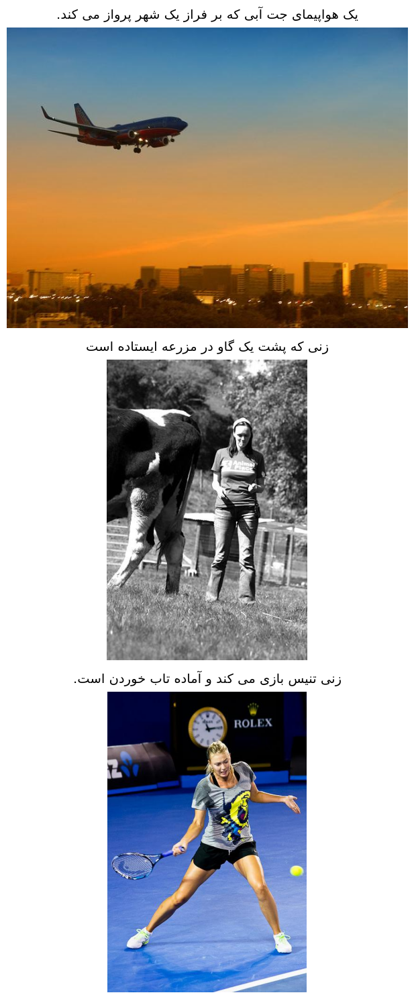

In [ ]:
plt.rcParams['font.family'] = 'DejaVu Sans'

local_csv_path = '/content/dataset/dataset/data.csv'
local_images_dir = '/content/dataset/dataset/images/'


df = pd.read_csv(local_csv_path)

num_samples = 3
samples = df.sample(num_samples)

plt.figure(figsize=(8, num_samples * 5))
for idx, (filename, caption) in enumerate(zip(samples.iloc[:, 0], samples.iloc[:, 1])):
    img_path = os.path.join(local_images_dir, filename)
    try:
        image = Image.open(img_path)

        reshaped_text = arabic_reshaper.reshape(caption)
        bidi_text = get_display(reshaped_text)

        plt.subplot(num_samples, 1, idx + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(bidi_text, fontsize=14, pad=10)

    except Exception as e:
        print(f"Error loading image {filename}: {e}")

plt.tight_layout()
plt.show()

Loading final processed captions from local NPZ file...
Generating final caption length distribution plot...


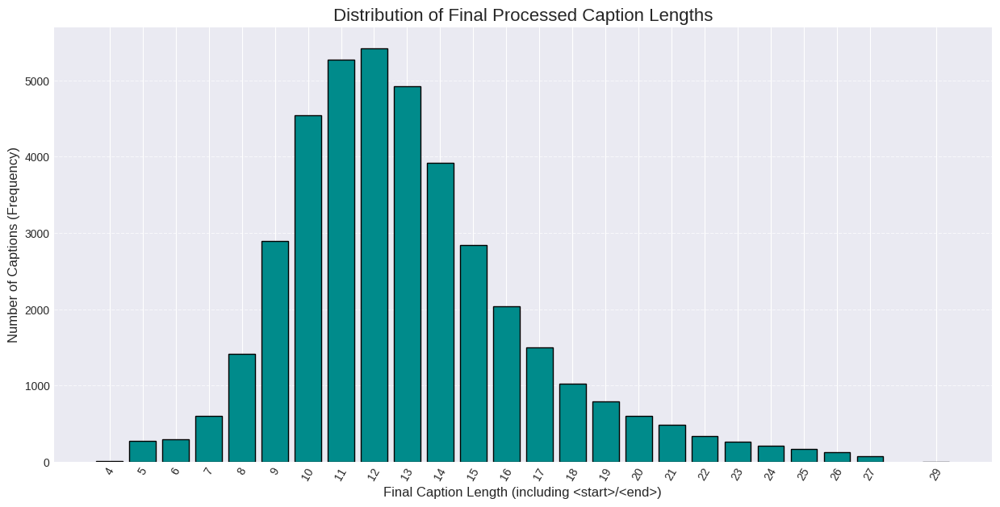

In [ ]:
local_npz_path = '/content/captions_and_vocab.npz'

print("Loading final processed captions from local NPZ file...")

npz_data = np.load(local_npz_path, allow_pickle=True)
final_captions = npz_data['captions']

final_lengths = [len(c) for c in final_captions]

length_counts = Counter(final_lengths)

sorted_lengths = sorted(length_counts.keys())
counts = [length_counts[length] for length in sorted_lengths]

print("Generating final caption length distribution plot...")

plt.style.use('seaborn-v0_8-darkgrid')
plt.figure(figsize=(15, 7))
plt.bar(sorted_lengths, counts, color='darkcyan', edgecolor='black')
plt.xticks(sorted_lengths, rotation=60)
plt.title('Distribution of Final Processed Caption Lengths', fontsize=16)
plt.xlabel('Final Caption Length (including <start>/<end>)', fontsize=12)
plt.ylabel('Number of Captions (Frequency)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:

local_csv_path = '/content/dataset/dataset/data.csv'

normalizer = Normalizer(correct_spacing=False)
def clean_and_normalize_caption(text):
    text = str(text)
    text = normalizer.normalize(text)
    punc_to_remove = r'[_،,;.?!:"\'«»()\[\]{}<>/\\-]'
    text = re.sub(punc_to_remove, ' ', text)
    text = re.sub(r'[^\u0600-\u06FF\u0030-\u0039\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

try:
    print("Loading and cleaning the original CSV file from local storage...")
    df = pd.read_csv(local_csv_path)

    cleaned_captions = df['text'].apply(clean_and_normalize_caption)

    print("Tokenizing all cleaned captions to count words...")
    all_tokens = [token for caption in cleaned_captions for token in word_tokenize(caption)]
    word_counts = Counter(all_tokens)

    print("Analysis complete.")

    print("\n" + "="*50)
    print(" Full Text Data Analysis (Before Filtering) ".center(50, "="))
    print("="*50)

    total_unique_words = len(word_counts)
    print(f"\nTotal number of unique words (before filtering): {total_unique_words}")

    top_10_words = word_counts.most_common(10)
    print("\nTop 10 most frequent words are:")
    for i, (word, count) in enumerate(top_10_words):
        print(f"  {i+1}. '{word}': {count} times")

except FileNotFoundError:
    print(f"ERROR: The file was not found at {local_csv_path}")

Loading and cleaning the original CSV file from local storage...
Tokenizing all cleaned captions to count words...
Analysis complete.

=== Full Text Data Analysis (Before Filtering) ===

Total number of unique words (before filtering): 8156

Top 10 most frequent words are:
  1. 'در': 30061 times
  2. 'یک': 24595 times
  3. 'با': 13215 times
  4. 'که': 12587 times
  5. 'و': 12351 times
  6. 'می': 12222 times
  7. 'از': 8941 times
  8. 'روی': 8583 times
  9. 'حال': 6012 times
  10. 'مردی': 4966 times


Loading NPZ file from local runtime...
Data loaded successfully. Total samples: 40000

Displaying information for Sample Index: 25539

Processed Numerical Caption:
[1, 12, 160, 53, 161, 132, 197, 1067, 20, 189, 24, 2]

Displaying the corresponding processed image...


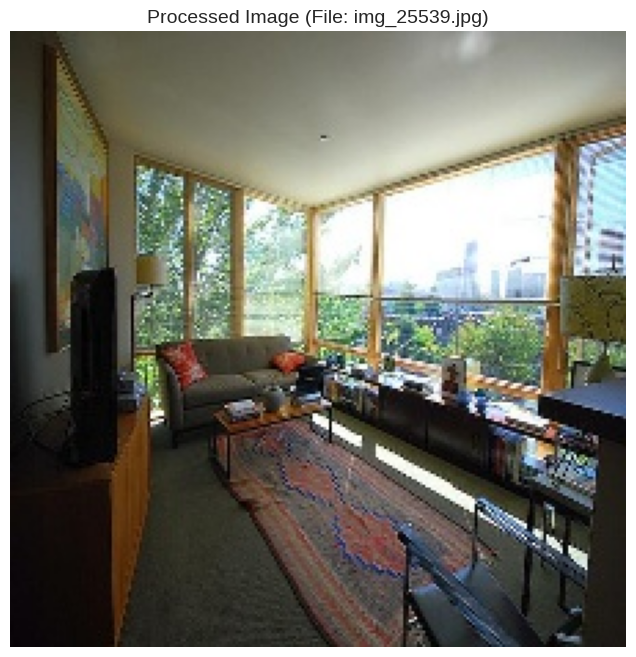


Corresponding Words Table:


,Index,Word
0,1,<start>
1,12,به
2,160,نظر
3,53,می
4,161,رسد
5,132,روز
6,197,بسیار
7,1067,خوبی
8,20,در
9,189,بیرون


In [ ]:
# ==============================================================================
# SCRIPT TO VISUALIZE A SINGLE PROCESSED SAMPLE FROM LOCAL DATA
# ==============================================================================

# --- 1. Define Local Paths ---
# These paths point to the output of your final preprocessing script.
LOCAL_NPZ_PATH = '/content/captions_and_vocab.npz'
LOCAL_IMAGE_DIR = '/content/extracted_images/'

# --- 2. Load Processed Data from the NPZ File ---
print("Loading NPZ file from local runtime...")

try:
    npz_data = np.load(LOCAL_NPZ_PATH, allow_pickle=True)
    captions = npz_data['captions']
    idx2word = npz_data['idx2word'].item()
    image_names = npz_data['image_names'] # Also load the image filenames
except FileNotFoundError:
    print(f"❌ ERROR: File not found at '{LOCAL_NPZ_PATH}'")
    print("Please run the final preprocessing script completely first.")
    raise

print(f"Data loaded successfully. Total samples: {len(captions)}")

# --- 3. Select and Retrieve a Random Sample ---

# Select a random index from the processed data
sample_index = random.randint(0, len(captions) - 1)

# Retrieve the numerical caption and the corresponding image filename
numerical_caption = captions[sample_index]
image_filename = image_names[sample_index]

# Construct the full path to the processed image
image_path = os.path.join(LOCAL_IMAGE_DIR, image_filename)

# Load the image from the local file
try:
    image = Image.open(image_path)
except FileNotFoundError:
    print(f"❌ ERROR: Image file not found at '{image_path}'")
    raise

# --- 4. Display the Results ---
print("\n" + "="*50)
print(f"Displaying information for Sample Index: {sample_index}")
print("="*50)

# Display the numerical caption
print(f"\nProcessed Numerical Caption:\n{numerical_caption}")

# Display the corresponding processed image
print("\nDisplaying the corresponding processed image...")
plt.figure(figsize=(8, 8))
# Assumes the image data is already normalized between 0 and 1
plt.imshow(image)
plt.title(f"Processed Image (File: {image_filename})", fontsize=14)
plt.axis('off') # Hide axes for a cleaner look
plt.show()

# Display the corresponding words table
print("\nCorresponding Words Table:")
caption_table_data = []
for index_val in numerical_caption:
    # Use .get() for safety in case an index is not in the dictionary
    word = idx2word.get(index_val, '<UNK>')
    caption_table_data.append([index_val, word])

# Use pandas for a nicely formatted table
df_table = pd.DataFrame(caption_table_data, columns=['Index', 'Word'])
display(df_table) # Use display() for better rendering in Colab

### Implementing CNN+RNN architecture with attention mechanism

In [9]:
class Encoder(nn.Module):
    """
    Encoder model based on EfficientNet-B7 to extract image features.
    The output is a feature map of shape (batch_size, 49, 2560).
    """
    def __init__(self, finetune=False):
        super(Encoder, self).__init__()
        efficientnet = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.DEFAULT)
        # We don't need the final classifier layers
        self.features = efficientnet.features

        # Freeze encoder layers by default
        if not finetune:
            for param in self.features.parameters():
                param.requires_grad = False

    def forward(self, images):
        # Input: (batch_size, 3, 224, 224)
        out = self.features(images)
        # Output after features: (batch_size, 2560, 7, 7)

        # Reshape for attention mechanism
        batch_size = out.size(0)
        features_dim = out.size(1)
        # Permute and flatten the spatial dimensions
        out = out.permute(0, 2, 3, 1) # (batch_size, 7, 7, 2560)
        out = out.view(batch_size, -1, features_dim) # (batch_size, 49, 2560)

        return out

In [ ]:
class AdditiveAttention(nn.Module):
    """
    Additive Attention mechanism.
    """
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(AdditiveAttention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)
        self.full_att = nn.Linear(attention_dim, 1)
        self.tanh = nn.Tanh()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, encoder_out, decoder_hidden):
        att1 = self.encoder_att(encoder_out)   # (batch_size, 49, attention_dim)
        att2 = self.decoder_att(decoder_hidden) # (batch_size, attention_dim)
        attention_combined = self.tanh(att1 + att2.unsqueeze(1)) # (batch_size, 49, attention_dim)
        attention_scores = self.full_att(attention_combined).squeeze(2) # (batch_size, 49)
        alpha = self.softmax(attention_scores) # (batch_size, 49)
        context_vector = (encoder_out * alpha.unsqueeze(2)).sum(dim=1) # (batch_size, encoder_dim)

        return context_vector, alpha

In [ ]:
class DecoderWithAttention(nn.Module):
    """
    Decoder model with an attention mechanism and a Deep Output Layer.
    """
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2560, dropout=0.5):
        super(DecoderWithAttention, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size

        self.attention = AdditiveAttention(encoder_dim, decoder_dim, attention_dim)
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()

        self.L_h = nn.Linear(decoder_dim, embed_dim)
        self.L_z = nn.Linear(encoder_dim, embed_dim)

        self.fc = nn.Linear(embed_dim, vocab_size)

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)
        device = encoder_out.device

        embeddings = self.embedding(encoded_captions)
        h, c = self.init_hidden_state(encoder_out)

        decode_lengths = [l - 1 for l in caption_lengths]
        predictions = torch.zeros(batch_size, max(decode_lengths), self.vocab_size).to(device)

        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])

            context_vector, alpha = self.attention(encoder_out[:batch_size_t], h[:batch_size_t])

            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
            context_vector = gate * context_vector

            lstm_input = torch.cat((embeddings[:batch_size_t, t, :], context_vector), dim=1)
            h, c = self.decode_step(lstm_input, (h[:batch_size_t], c[:batch_size_t]))

            deep_output_input = (
                embeddings[:batch_size_t, t, :] +  # E * y_{t-1}
                self.L_h(h) +                      # L_h * h_t
                self.L_z(context_vector)           # L_z * z_t
            )


            preds = self.fc(self.dropout(deep_output_input))

            predictions[:batch_size_t, t, :] = preds

        return predictions, encoded_captions, decode_lengths, None

In [ ]:
class ImageCaptioningModel(nn.Module):
    """
    A single, unified model that combines the Encoder and Decoder.
    Now includes both Greedy and Beam Search generation methods.
    """
    def __init__(self, embed_dim, decoder_dim, attention_dim, vocab_size, encoder_dim, finetune_encoder=False, dropout=0.5):
        super(ImageCaptioningModel, self).__init__()
        self.encoder = Encoder(finetune=finetune_encoder)
        self.decoder = DecoderWithAttention(
            attention_dim=attention_dim,
            embed_dim=embed_dim,
            decoder_dim=decoder_dim,
            vocab_size=vocab_size,
            encoder_dim=encoder_dim,
            dropout=dropout
        )

    def forward(self, images, encoded_captions, caption_lengths):
        """
        The forward pass for training (uses teacher forcing).
        """
        features = self.encoder(images)
        outputs = self.decoder(features, encoded_captions, caption_lengths)
        return outputs

    def generate_caption_greedy(self, image_tensor, word2idx, idx2word, max_length=50):
        """
        Generates a caption for a single image using GREEDY SEARCH.
        (Corrected to use the Deep Output Layer)
        """
        self.eval()
        device = image_tensor.device
        caption_indices = [word2idx['<start>']]

        with torch.no_grad():
            encoder_out = self.encoder(image_tensor)
            h, c = self.decoder.init_hidden_state(encoder_out)

            for _ in range(max_length):
                previous_word_idx = torch.LongTensor([caption_indices[-1]]).to(device)
                embeddings = self.decoder.embedding(previous_word_idx)
                context_vector, _ = self.decoder.attention(encoder_out, h)

                lstm_input = torch.cat((embeddings, context_vector), dim=1)
                h, c = self.decoder.decode_step(lstm_input, (h, c))



                deep_output_input = (
                    embeddings +
                    self.decoder.L_h(h) +
                    self.decoder.L_z(context_vector)
                )

                preds = self.decoder.fc(deep_output_input)

                predicted_idx = preds.argmax(1).item()
                caption_indices.append(predicted_idx)

                if predicted_idx == word2idx['<end>']:
                    break

        caption_words = [idx2word.get(idx, '<unk>') for idx in caption_indices]
        return caption_words



    def generate_caption_beam_search(self, image_tensor, word2idx, idx2word, beam_size=3, max_length=50):
        """
        Generates a caption for a single image using BEAM SEARCH.
        (Corrected for hidden state bug, Deep Output Layer, and simplified logic)
        """
        self.eval()
        device = image_tensor.device
        vocab_size = len(word2idx)

        with torch.no_grad():
            encoder_out = self.encoder(image_tensor)
            h, c = self.decoder.init_hidden_state(encoder_out)

            h = h.expand(beam_size, self.decoder.decoder_dim)
            c = c.expand(beam_size, self.decoder.decoder_dim)

            k_prev_words = torch.LongTensor([[word2idx['<start>']]] * beam_size).to(device)
            seqs = k_prev_words
            top_k_scores = torch.zeros(beam_size, 1).to(device)

            complete_seqs = list()
            complete_seqs_scores = list()

            for step in range(max_length):
                embeddings = self.decoder.embedding(k_prev_words).squeeze(1)
                context_vector, _ = self.decoder.attention(encoder_out, h)

                gate = self.decoder.sigmoid(self.decoder.f_beta(h))
                context_vector = gate * context_vector

                lstm_input = torch.cat((embeddings, context_vector), dim=1)
                h, c = self.decoder.decode_step(lstm_input, (h, c))

                deep_output_input = (embeddings + self.decoder.L_h(h) + self.decoder.L_z(context_vector))
                scores = self.decoder.fc(deep_output_input)
                scores = F.log_softmax(scores, dim=1)

                scores = top_k_scores.expand_as(scores) + scores

                if step == 0:
                    top_k_scores, top_k_words = scores[0].topk(beam_size, 0, True, True)
                else:
                    top_k_scores, top_k_words = scores.view(-1).topk(beam_size, 0, True, True)

                prev_beam_inds = top_k_words // vocab_size
                next_word_inds = top_k_words % vocab_size

                seqs = torch.cat((seqs[prev_beam_inds], next_word_inds.unsqueeze(1)), dim=1)


                incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if next_word != word2idx['<end>']]
                complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

                if len(complete_inds) > 0:
                    complete_seqs.extend(seqs[complete_inds].tolist())

                    complete_seqs_scores.extend([top_k_scores[i] / (step + 1) for i in complete_inds])

                beam_size = len(incomplete_inds)
                if beam_size == 0:
                    break

                seqs = seqs[incomplete_inds]
                h = h[prev_beam_inds[incomplete_inds]]
                c = c[prev_beam_inds[incomplete_inds]]
                encoder_out = encoder_out if encoder_out.size(0) == beam_size else encoder_out[:beam_size]
                top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
                k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        if len(complete_seqs) == 0:
            best_seq_indices = seqs[0].tolist()
        else:
            best_seq_index = complete_seqs_scores.index(max(complete_seqs_scores))
            best_seq_indices = complete_seqs[best_seq_index]

        caption_words = [idx2word.get(idx, '<unk>') for idx in best_seq_indices]
        return caption_words


### Training and evaluation

--- Using device: cuda ---
--- Loading preprocessed data... ---
--- Creating DataLoaders from individual image files... ---
--- DataLoaders created successfully. ---


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


--- Checkpoint found at '/content/drive/MyDrive/ImageCaptioning/best_model.pth.tar'! Resuming training... ---
--- Resuming from epoch 23. Best BLEU-4 so far: 0.0416 ---

--- Starting Training ---

--- Epoch 24/70 ---


Evaluating: 100%|██████████| 63/63 [03:45<00:00,  3.58s/it]



--- Random Validation Example ---


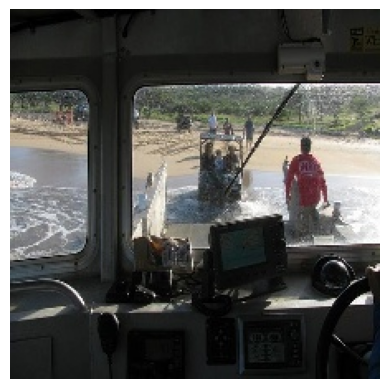

  Real Caption: داخل یک وسیله نقلیه بزرگ با نمایی از یک منطقه روستایی که افراد در حال انجام کارهای مختلف هستند
  Generated Caption: یک کامیون در حال رانندگی در خیابان در کنار یک ماشین
---------------------------------
Epoch Summary: Train Loss: 2.4067 | Val Loss: 3.1209 | BLEU-1: 0.2358 | BLEU-4: 0.0418
--- Current Learning Rate: 4e-05 ---
New best model saved with BLEU-4: 0.0418

--- Epoch 25/70 ---


Evaluating: 100%|██████████| 63/63 [03:44<00:00,  3.57s/it]



--- Random Validation Example ---


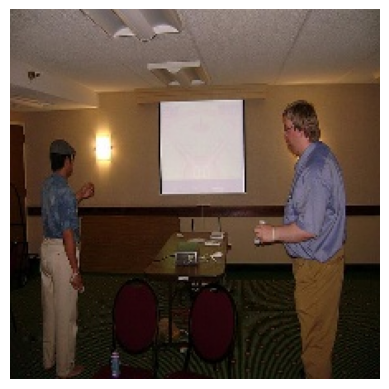

  Real Caption: دو مرد در این تصویر هستند که یکی به صفحه پروژکتور نگاه می کند
  Generated Caption: مردی در حال بازی با یک بازی ویدیویی با یک <unk> <unk>
---------------------------------
Epoch Summary: Train Loss: 2.3953 | Val Loss: 3.1250 | BLEU-1: 0.2354 | BLEU-4: 0.0415
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 1 epochs.

--- Epoch 26/70 ---


Evaluating: 100%|██████████| 63/63 [03:40<00:00,  3.49s/it]



--- Random Validation Example ---


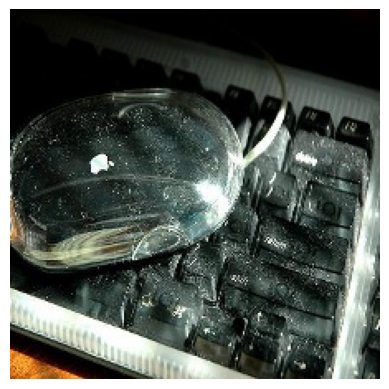

  Real Caption: یک موس اپل خراشیده بالای صفحه کلید
  Generated Caption: یک قایق کوچک یک قایق کوچک و یک قایق
---------------------------------
Epoch Summary: Train Loss: 2.3853 | Val Loss: 3.1331 | BLEU-1: 0.2380 | BLEU-4: 0.0421
--- Current Learning Rate: 4e-05 ---
New best model saved with BLEU-4: 0.0421

--- Epoch 27/70 ---


Evaluating: 100%|██████████| 63/63 [03:43<00:00,  3.54s/it]



--- Random Validation Example ---


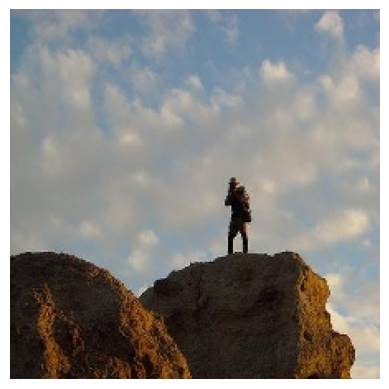

  Real Caption: یک کوهنورد مرد بالای یک صخره بسیار بزرگ ایستاده و مشغول عکس گرفتن است
  Generated Caption: صخره ای در حال بالا رفتن از یک کوه بزرگ در حال پرواز است
---------------------------------
Epoch Summary: Train Loss: 2.3748 | Val Loss: 3.1374 | BLEU-1: 0.2358 | BLEU-4: 0.0410
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 1 epochs.

--- Epoch 28/70 ---


Evaluating: 100%|██████████| 63/63 [03:48<00:00,  3.62s/it]



--- Random Validation Example ---


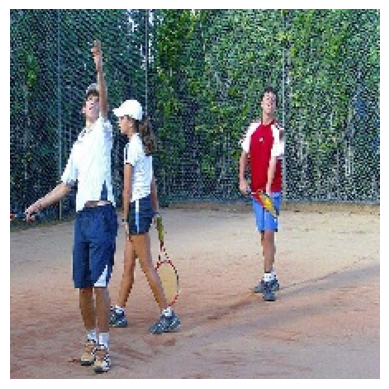

  Real Caption: سه نوجوان در زمینی که در فضای سبز احاطه شده در حال بازی تنیس هستند
  Generated Caption: دو مرد در حال بازی بیسبال در یک زمین در حال بازی فوتبال
---------------------------------
Epoch Summary: Train Loss: 2.3646 | Val Loss: 3.1465 | BLEU-1: 0.2341 | BLEU-4: 0.0414
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 2 epochs.

--- Epoch 29/70 ---


Evaluating: 100%|██████████| 63/63 [03:42<00:00,  3.53s/it]



--- Random Validation Example ---


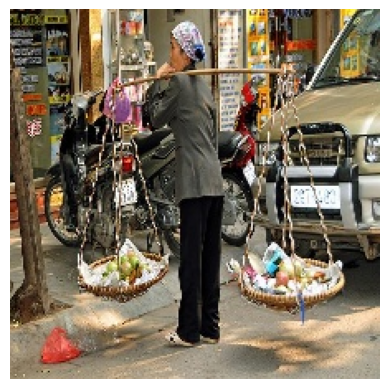

  Real Caption: خانمی در خیابان که باری از وسایل حمل می کند
  Generated Caption: مردی در حال بریدن یک تکه کیک است
---------------------------------
Epoch Summary: Train Loss: 2.3547 | Val Loss: 3.1528 | BLEU-1: 0.2362 | BLEU-4: 0.0414
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 3 epochs.

--- Epoch 30/70 ---


Evaluating: 100%|██████████| 63/63 [03:50<00:00,  3.65s/it]



--- Random Validation Example ---


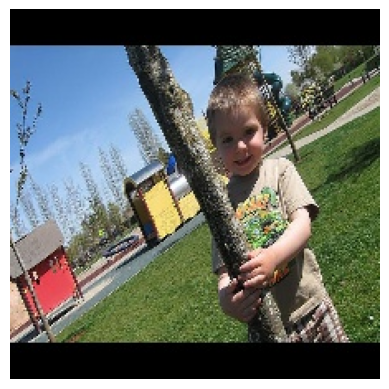

  Real Caption: کودکی که در پارکی به درختی چسبیده_است
  Generated Caption: مردی با پیراهن آبی و شورت آبی در حال بازی با فریزبی
---------------------------------
Epoch Summary: Train Loss: 2.3450 | Val Loss: 3.1585 | BLEU-1: 0.2373 | BLEU-4: 0.0411
--- Current Learning Rate: 8.000000000000001e-06 ---
No improvement in validation BLEU-4 for 4 epochs.

--- Epoch 31/70 ---


Evaluating: 100%|██████████| 63/63 [03:43<00:00,  3.55s/it]



--- Random Validation Example ---


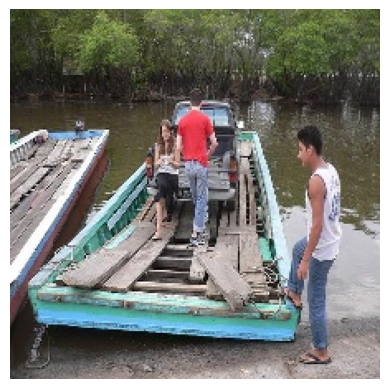

  Real Caption: مردم در اطراف یک کامیون پارک شده در یک قایق جمع می شوند
  Generated Caption: یک نفر در قطار در حال حرکت به سمت قطار است
---------------------------------
Epoch Summary: Train Loss: 2.3161 | Val Loss: 3.1618 | BLEU-1: 0.2364 | BLEU-4: 0.0410
--- Current Learning Rate: 8.000000000000001e-06 ---
No improvement in validation BLEU-4 for 5 epochs.

--- Epoch 32/70 ---


Evaluating: 100%|██████████| 63/63 [03:48<00:00,  3.63s/it]



--- Random Validation Example ---


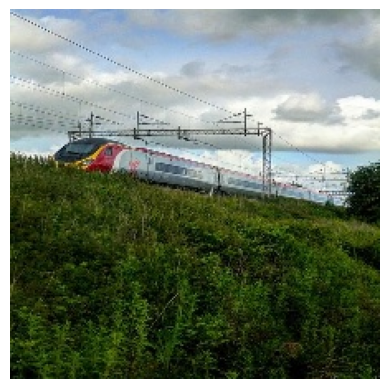

  Real Caption: قطاری روی تپه ای شیب دار از چمن سبز
  Generated Caption: قطاری در مسیر
---------------------------------
Epoch Summary: Train Loss: 2.3096 | Val Loss: 3.1637 | BLEU-1: 0.2363 | BLEU-4: 0.0415
--- Current Learning Rate: 8.000000000000001e-06 ---
No improvement in validation BLEU-4 for 6 epochs.

--- Epoch 33/70 ---


Evaluating: 100%|██████████| 63/63 [03:48<00:00,  3.62s/it]



--- Random Validation Example ---


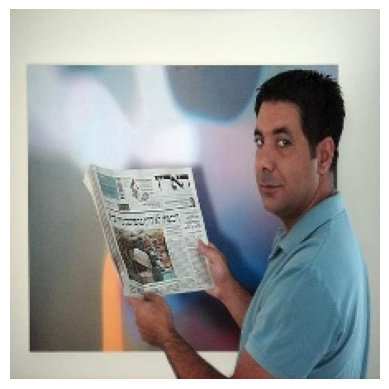

  Real Caption: مردی با پیراهن آبی در حالی که روزنامه ای به زبان خارجی در دست گرفته_است به دوربین نگاه می کند
  Generated Caption: مردی با پیراهن سفید در حال لبخند زدن در حالی که یک تلفن همراه در دست دارد
---------------------------------
Epoch Summary: Train Loss: 2.3076 | Val Loss: 3.1659 | BLEU-1: 0.2373 | BLEU-4: 0.0414
--- Current Learning Rate: 8.000000000000001e-06 ---
No improvement in validation BLEU-4 for 7 epochs.

--- Epoch 34/70 ---


Evaluating: 100%|██████████| 63/63 [03:40<00:00,  3.51s/it]



--- Random Validation Example ---


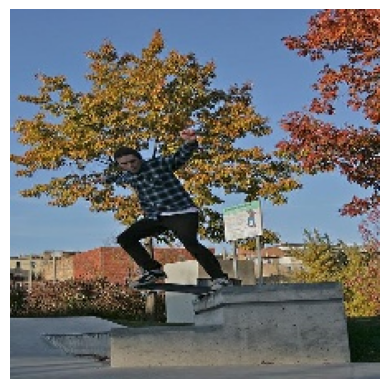

  Real Caption: مردی با اسکیت از روی طاقچه می پرد
  Generated Caption: یک نیمکت چوبی با یک نیمکت و یک نیمکت و یک تخت
---------------------------------
Epoch Summary: Train Loss: 2.3079 | Val Loss: 3.1677 | BLEU-1: 0.2373 | BLEU-4: 0.0411
--- Current Learning Rate: 1.6000000000000004e-06 ---
No improvement in validation BLEU-4 for 8 epochs.

--- Epoch 35/70 ---


Evaluating: 100%|██████████| 63/63 [03:41<00:00,  3.51s/it]



--- Random Validation Example ---


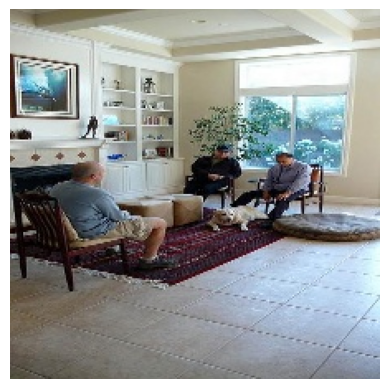

  Real Caption: سه مرد روی صندلی جلوی شومینه نشسته_اند و سگی روی زمین دراز کشیده_است
  Generated Caption: یک اتاق نشیمن با یک میز و یک میز با یک پنجره
---------------------------------
Epoch Summary: Train Loss: 2.3012 | Val Loss: 3.1687 | BLEU-1: 0.2361 | BLEU-4: 0.0409
--- Current Learning Rate: 1.6000000000000004e-06 ---
No improvement in validation BLEU-4 for 9 epochs.

--- Epoch 36/70 ---


Evaluating: 100%|██████████| 63/63 [03:43<00:00,  3.54s/it]



--- Random Validation Example ---


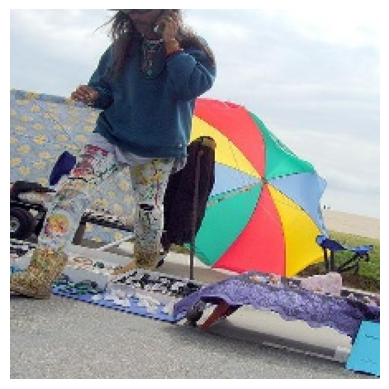

  Real Caption: مردی با پیراهن آبی در حال راه رفتن است و با تلفن صحبت می کند
  Generated Caption: یک سگ قهوه ای در حال پرواز بادبادک در ساحل
---------------------------------
Epoch Summary: Train Loss: 2.3007 | Val Loss: 3.1692 | BLEU-1: 0.2364 | BLEU-4: 0.0415
--- Current Learning Rate: 1.6000000000000004e-06 ---
No improvement in validation BLEU-4 for 10 epochs.

--- Epoch 37/70 ---


Evaluating: 100%|██████████| 63/63 [03:57<00:00,  3.77s/it]



--- Random Validation Example ---


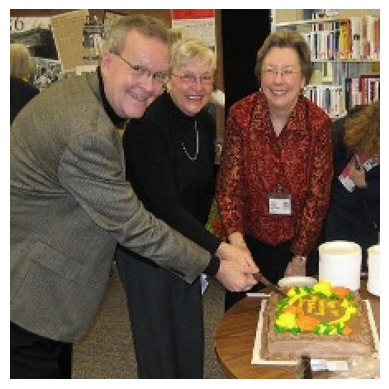

  Real Caption: سه نفر در حال بریدن کیک در حالی که لبخند می زنند
  Generated Caption: مردی با پیراهن قرمز و کیک در حال خوردن یک کیک
---------------------------------
Epoch Summary: Train Loss: 2.2979 | Val Loss: 3.1696 | BLEU-1: 0.2359 | BLEU-4: 0.0407
--- Current Learning Rate: 1.6000000000000004e-06 ---
No improvement in validation BLEU-4 for 11 epochs.

--- Epoch 38/70 ---


Evaluating: 100%|██████████| 63/63 [04:02<00:00,  3.85s/it]



--- Random Validation Example ---


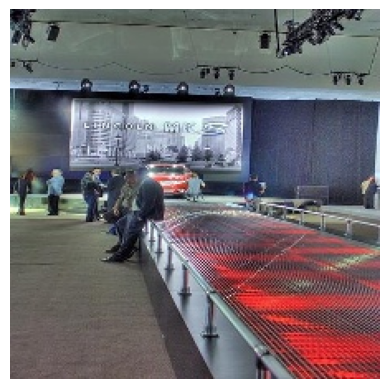

  Real Caption: گروهی از مردم یک ماشین لینکلن را در یک نمایشگاه اتومبیل تحسین می کنند
  Generated Caption: یک قطار مسافربری در ایستگاه قطار
---------------------------------
Epoch Summary: Train Loss: 2.2981 | Val Loss: 3.1698 | BLEU-1: 0.2371 | BLEU-4: 0.0408
--- Current Learning Rate: 3.200000000000001e-07 ---
No improvement in validation BLEU-4 for 12 epochs.
Early stopping triggered after 12 epochs with no improvement.

--- Training finished. Loading best model and running on test set... ---


Evaluating: 100%|██████████| 63/63 [03:49<00:00,  3.64s/it]



--- FINAL TEST RESULTS ---
Test Loss: 3.1399 | Test BLEU-1: 0.2311 | Test BLEU-4: 0.0385


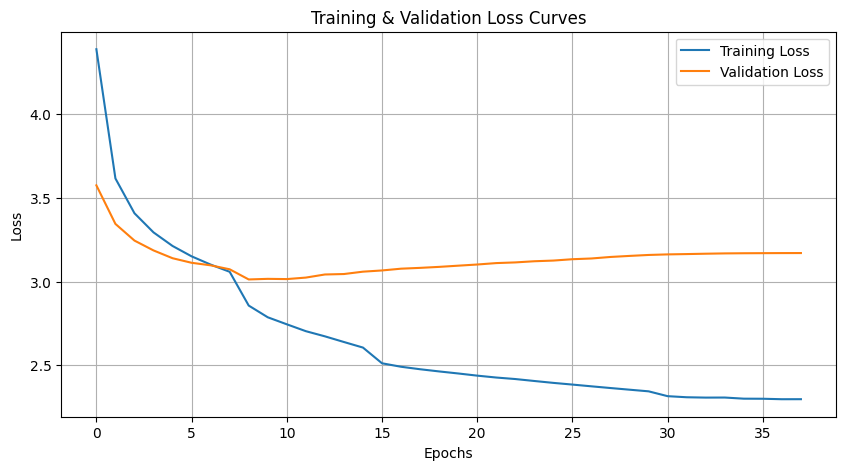

In [ ]:
# --- PART 1: CONFIGURATION ---

NPZ_PATH = '/content/captions_and_vocab.npz'
CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/best_model.pth.tar'

CHECKPOINT_DIR = os.path.dirname(CHECKPOINT_PATH)

os.makedirs(CHECKPOINT_DIR, exist_ok=True)

params = {
    'num_samples': None,
    'epochs': 70,
    'batch_size': 64,
    'learning_rate': 0.001,
    'weight_decay': 0.00001,
    'lr_patience': 3,
    'early_stop_patience': 12
}

model_params = {
    'embed_dim': 256,
    'decoder_dim': 512,
    'attention_dim': 256,
    'encoder_dim': 2560,
    'dropout': 0.6,
    'finetune_encoder': False
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"--- Using device: {device} ---")


# =====================================================================================
# PART 2: DATA LOADING AND PREPARATION
# =====================================================================================
print("--- Loading preprocessed data... ---")
npz_data = np.load(NPZ_PATH, allow_pickle=True)
captions = npz_data['captions']
image_names = npz_data['image_names']
word2idx = npz_data['word2idx'].item()
idx2word = npz_data['idx2word'].item()
vocab_size = len(word2idx)

if params['num_samples'] is not None:
    print(f"--- Running in test mode: Using {params['num_samples']} samples. ---")
    captions = captions[:params['num_samples']]

indices = list(range(len(captions)))
train_indices, temp_indices = train_test_split(indices, test_size=0.2, random_state=42)
val_indices, test_indices = train_test_split(temp_indices, test_size=0.5, random_state=42)


class ImageFileDataset(Dataset):
    def __init__(self, image_dir, all_captions, all_image_names, indices, transform=None):
        self.image_dir = image_dir
        self.transform = transform


        self.indices = indices
        self.captions = [all_captions[i] for i in indices]
        self.image_names = [all_image_names[i] for i in indices]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):

        image_filename = self.image_names[idx]
        img_path = os.path.join(self.image_dir, image_filename)


        image = Image.open(img_path).convert('RGB')
        image_numpy = np.array(image)
        image_tensor = torch.FloatTensor(image_numpy).permute(2, 0, 1) / 255.0

        if self.transform:
            image_tensor = self.transform(image_tensor)

        caption = torch.LongTensor(self.captions[idx])
        caption_length = torch.LongTensor([len(caption)])

        return image_tensor, caption, caption_length

def collate_fn(batch):
    batch.sort(key=lambda x: x[2], reverse=True)
    images, captions, lengths = zip(*batch)
    images = torch.stack(images, 0)
    padded_captions = nn.utils.rnn.pad_sequence(captions, batch_first=True, padding_value=word2idx['<pad>'])
    lengths = torch.tensor(lengths, dtype=torch.long)
    return images, padded_captions, lengths

IMAGE_DIR = '/content/extracted_images/'

print("--- Creating DataLoaders from individual image files... ---")

train_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, train_indices)
val_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, val_indices)
test_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, test_indices)

train_loader = DataLoader(train_dataset, batch_size=params['batch_size'], shuffle=True, num_workers=2, pin_memory=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=params['batch_size'], shuffle=False, num_workers=2, pin_memory=True, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=params['batch_size'], shuffle=False, num_workers=2, pin_memory=True, collate_fn=collate_fn)
print("--- DataLoaders created successfully. ---")


# =====================================================================================
# PART 3: HELPER FUNCTIONS FOR TRAINING AND EVALUATION
# =====================================================================================

def train_epoch(model, loader, optimizer, criterion ):
    model.train()
    total_loss = 0.0
    for imgs, caps, caplens in tqdm(loader, desc="Training"):
        imgs, caps = imgs.to(device), caps.to(device)

        optimizer.zero_grad()

        outputs, caps_sorted, decode_lengths, _ = model(imgs, caps, caplens)
        targets = caps_sorted[:, 1:] # Targets are captions without <start> token
        # Pack outputs and targets to ignore padding in loss calculation
        packed_outputs = nn.utils.rnn.pack_padded_sequence(outputs, decode_lengths, batch_first=True).data
        packed_targets = nn.utils.rnn.pack_padded_sequence(targets, decode_lengths, batch_first=True).data
        loss = criterion(packed_outputs, packed_targets)

        loss.backward()

        # Clip gradients to prevent exploding
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)

        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)


def evaluate(model, loader, criterion, word2idx, idx2word, show_example=False):
    model.eval()
    total_loss = 0.0
    references, hypotheses = [], []

    with torch.no_grad():
        for i, (imgs, caps, caplens) in enumerate(tqdm(loader, desc="Evaluating")):
            imgs_val, caps_val = imgs.to(device), caps.to(device)

            # --- Loss Calculation (unchanged) ---
            outputs, caps_sorted, decode_lengths, _ = model(imgs_val, caps_val, caplens)
            targets = caps_sorted[:, 1:]
            packed_outputs = nn.utils.rnn.pack_padded_sequence(outputs, decode_lengths, batch_first=True).data
            packed_targets = nn.utils.rnn.pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            loss = criterion(packed_outputs, packed_targets)
            total_loss += loss.item()

            # --- BLEU Score Preparation (unchanged) ---
            # Real captions (references)
            all_caps_indices = caps.cpu().numpy()
            for cap_indices in all_caps_indices:
                real_words = [idx2word.get(idx, '<unk>') for idx in cap_indices if idx not in {word2idx['<start>'], word2idx['<end>'], word2idx['<pad>']}]
                references.append([real_words])

            # Generated captions (hypotheses)
            for img_tensor in imgs_val:
                generated_words = model.generate_caption_greedy(img_tensor.unsqueeze(0), word2idx, idx2word)
                hypotheses.append(generated_words[1:-1])

    # Calculate BLEU scores
    bleu1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0))
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    # --- CORRECTED EXAMPLE DISPLAY LOGIC ---
    if show_example:
        # Get a random index from the validation set
        random_idx_in_val_set = random.randint(0, len(val_dataset) - 1)

        # Get the corresponding image and real caption
        img_example, cap_example, _ = val_dataset[random_idx_in_val_set]

        # Move image to device for generation
        img_example_tensor = img_example.unsqueeze(0).to(device)

        # Generate a caption for THIS specific image
        generated_caption_words = model.generate_caption_greedy(img_example_tensor, word2idx, idx2word)

        # Convert real caption indices to words
        real_caption_words = [idx2word.get(idx, '<unk>') for idx in cap_example.tolist() if idx not in {word2idx['<start>'], word2idx['<end>'], word2idx['<pad>']}]

        print(f"\n--- Random Validation Example ---")
        # Permute from (C,H,W) to (H,W,C) for plotting
        plt.imshow(img_example.permute(1, 2, 0))
        plt.axis('off')
        plt.show()
        print(f"  Real Caption: {' '.join(real_caption_words)}")
        print(f"  Generated Caption: {' '.join(generated_caption_words[1:-1])}") # Exclude <start>/<end>
        print(f"---------------------------------")

    return total_loss / len(loader), bleu1, bleu4


if __name__ == '__main__':
    model = ImageCaptioningModel(vocab_size=vocab_size, **model_params).to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=word2idx['<pad>'])
    optimizer = torch.optim.Adam(model.parameters(), lr=params['learning_rate'], weight_decay=params['weight_decay'])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=params['lr_patience'], factor=0.2, verbose=True)

    start_epoch = 0
    best_bleu4 = 0.0
    train_losses, val_losses = [], []

    if os.path.exists(CHECKPOINT_PATH):
        print(f"--- Checkpoint found at '{CHECKPOINT_PATH}'! Resuming training... ---")
        checkpoint = torch.load(CHECKPOINT_PATH)

        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        start_epoch = checkpoint['epoch']
        best_bleu4 = checkpoint['best_bleu4']
        train_losses = checkpoint['train_losses']
        val_losses = checkpoint['val_losses']

        print(f"--- Resuming from epoch {start_epoch}. Best BLEU-4 so far: {best_bleu4:.4f} ---")
    else:
        print(f"--- No checkpoint found at '{CHECKPOINT_PATH}'. Starting from scratch. ---")


    epochs_no_improve = 0
    print("\n--- Starting Training ---")

    for epoch in range(start_epoch, params['epochs']):
        print(f"\n--- Epoch {epoch+1}/{params['epochs']} ---")

        train_loss = train_epoch(model, train_loader, optimizer, criterion)
        val_loss, bleu1, bleu4 = evaluate(model, val_loader, criterion, word2idx, idx2word, show_example=True)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        scheduler.step(bleu4)
        print(f"Epoch Summary: Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | BLEU-1: {bleu1:.4f} | BLEU-4: {bleu4:.4f}")
        current_lr = optimizer.param_groups[0]['lr']
        print(f"--- Current Learning Rate: {current_lr} ---")
        is_best = bleu4 > best_bleu4
        if is_best:
            best_bleu4 = bleu4
            epochs_no_improve = 0

            print(f"New best model saved with BLEU-4: {best_bleu4:.4f}")

            state = {
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'best_bleu4': best_bleu4,
                'train_losses': train_losses,
                'val_losses': val_losses
            }
            torch.save(state, CHECKPOINT_PATH)

        else:
            epochs_no_improve += 1
            print(f"No improvement in validation BLEU-4 for {epochs_no_improve} epochs.")

        if epochs_no_improve >= params['early_stop_patience']:
            print(f"Early stopping triggered after {params['early_stop_patience']} epochs with no improvement.")
            break


    # --- Final Test Evaluation ---
    print("\n--- Training finished. Loading best model and running on test set... ---")

    checkpoint = torch.load(CHECKPOINT_PATH)

    model.load_state_dict(checkpoint['model_state_dict'])

    test_loss, test_bleu1, test_bleu4 = evaluate(model, test_loader, criterion, word2idx, idx2word)
    print(f"\n--- FINAL TEST RESULTS ---")
    print(f"Test Loss: {test_loss:.4f} | Test BLEU-1: {test_bleu1:.4f} | Test BLEU-4: {test_bleu4:.4f}")

    # --- Plotting Loss Curves ---
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training & Validation Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/best_model.pth.tar'
NPZ_PATH = '/content/captions_and_vocab.npz'

print("--- Loading necessary info to build the model... ---")

npz_data = np.load(NPZ_PATH, allow_pickle=True)
vocab_size = len(npz_data['word2idx'].item())

model_params = {
    'embed_dim': 256,
    'decoder_dim': 512,
    'attention_dim': 256,
    'encoder_dim': 2560,
    'dropout': 0.6,
    'finetune_encoder': False
}

params = {
    'num_samples': None,
    'epochs': 70,
    'batch_size': 64,
    'learning_rate': 0.001,
    'weight_decay': 0.00001,
    'lr_patience': 3,
    'early_stop_patience': 12
}

print(f"--- Building the model and loading weights from '{CHECKPOINT_PATH}'... ---")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = ImageCaptioningModel(vocab_size=vocab_size, **model_params).to(device)

checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)

model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print("✅ Model loaded successfully.")

print("\n" + "="*80)
print(" Model Summary ".center(80, "="))
print("="*80)


BATCH_SIZE = params.get('batch_size', 64)
MAX_CAPTION_LENGTH = 50

summary(model,
        input_data=[
            torch.randn(BATCH_SIZE, 3, 224, 224), # images
            torch.randint(0, vocab_size, (BATCH_SIZE, MAX_CAPTION_LENGTH)), # encoded_captions
            torch.full((BATCH_SIZE, 1), MAX_CAPTION_LENGTH) # caption_lengths
        ],
        col_names=["input_size", "output_size", "num_params", "mult_adds"],
        device=device
)

--- Loading necessary info to build the model... ---
--- Building the model and loading weights from '/content/drive/MyDrive/ImageCaptioning/best_model.pth.tar'... ---
✅ Model loaded successfully.

================================ Model Summary =================================


Layer (type:depth-idx)                                       Input Shape               Output Shape              Param #                   Mult-Adds
ImageCaptioningModel                                         [64, 3, 224, 224]         [64, 49, 3992]            --                        --
├─Encoder: 1-1                                               [64, 3, 224, 224]         [64, 49, 2560]            --                        --
│    └─Sequential: 2-1                                       [64, 3, 224, 224]         [64, 2560, 7, 7]          --                        --
│    │    └─Conv2dNormActivation: 3-1                        [64, 3, 224, 224]         [64, 64, 112, 112]        (1,856)                   1,387,274,240
│    │    └─Sequential: 3-2                                  [64, 64, 112, 112]        [64, 32, 112, 112]        (10,920)                  5,266,752,000
│    │    └─Sequential: 3-3                                  [64, 32, 112, 112]        [64, 48, 56, 56]          (253,4

--- Step 1: Setting up paths and loading the trained model... ---
✅ Model loaded successfully from checkpoint.

--- Step 2: Generating and displaying 3 random samples... ---


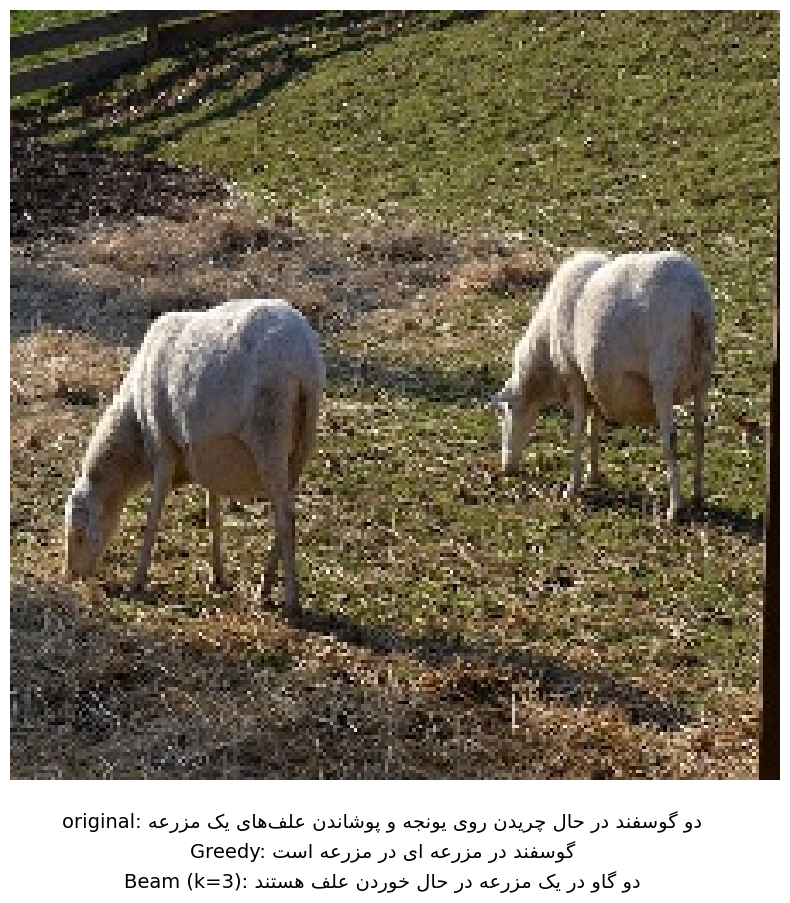

--------------------------------------------------------------------------------


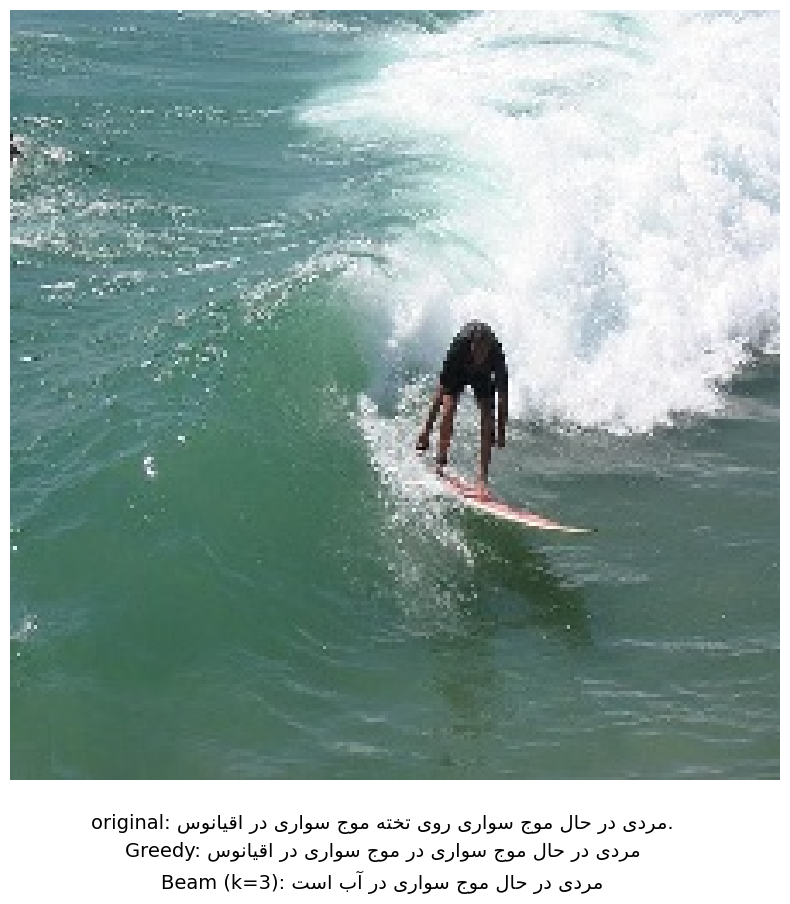

--------------------------------------------------------------------------------


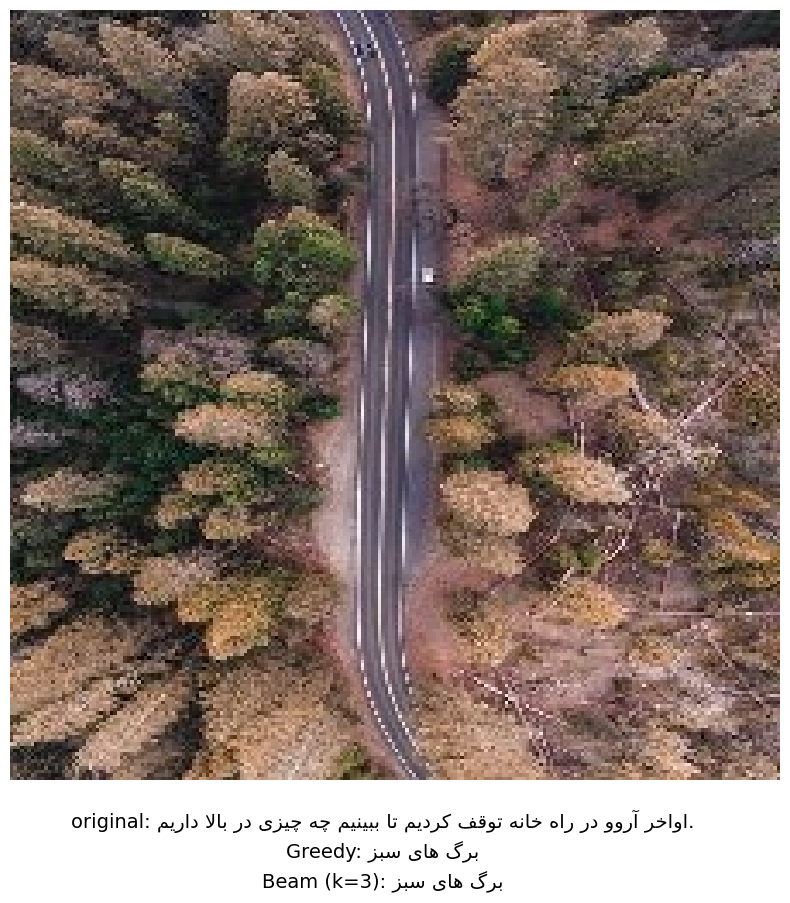

--------------------------------------------------------------------------------


In [ ]:
# ==============================================================================
# SCRIPT TO VISUALIZE AND COMPARE MODEL PREDICTIONS
# ==============================================================================


# --- 1. Setup: Define Paths and Load Model ---

print("--- Step 1: Setting up paths and loading the trained model... ---")

# --- Paths ---
# Data paths are local to the Colab runtime
LOCAL_NPZ_PATH = '/content/captions_and_vocab.npz'
LOCAL_IMAGE_DIR = '/content/extracted_images/'

# Checkpoint path is on Google Drive for persistence
# ⚠️ Make sure this path points to your saved model
CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/best_model.pth.tar'

# --- Load Vocabulary and File Lists ---
try:
    npz_data = np.load(LOCAL_NPZ_PATH, allow_pickle=True)
    word2idx = npz_data['word2idx'].item()
    idx2word = npz_data['idx2word'].item()
    image_names = npz_data['image_names']
    # Load original captions to display ground truth
    # We assume the original captions are also in the NPZ, if not, load from CSV
    original_captions_df = pd.read_csv('/content/dataset/dataset/data.csv')
    image_name_to_caption = pd.Series(original_captions_df.text.values, index=original_captions_df.image).to_dict()

except FileNotFoundError:
    print(f"❌ ERROR: Could not find data files. Please run the preprocessing script first.")
    raise

# --- Build and Load Model ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Model parameters should be the same as during training
model_params = {
    'embed_dim': 256,
    'decoder_dim': 512,
    'attention_dim': 256,
    'encoder_dim': 2560,
    'dropout': 0.5,
    'finetune_encoder': False
}
vocab_size = len(word2idx)

# Instantiate the model
model = ImageCaptioningModel(vocab_size=vocab_size, **model_params).to(device)

# Load the trained weights from the checkpoint
try:
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval() # Set model to evaluation mode
    print("✅ Model loaded successfully from checkpoint.")
except FileNotFoundError:
    print(f"❌ ERROR: Checkpoint not found at '{CHECKPOINT_PATH}'")
    raise


# --- 2. Helper function to preprocess a single image for inference ---
def preprocess_for_inference(image_path, target_size=(224, 224)):
    """
    Loads and preprocesses a single image to be fed into the model.
    This must match the preprocessing used in your training script.
    """
    image = Image.open(image_path).convert('RGB')

    # In your last script, you resized by squashing, so we do the same here.
    image = image.resize(target_size)

    image_numpy = np.array(image)
    # Normalize to [0, 1] and create tensor
    image_tensor = torch.FloatTensor(image_numpy).permute(2, 0, 1) / 255.0

    # Add batch dimension and send to device
    return image_tensor.unsqueeze(0).to(device)


# --- 3. Main Visualization Function ---
def visualize_predictions(num_samples=3):
    """
    Selects random samples and displays the image with all three captions.
    """
    print(f"\n--- Step 2: Generating and displaying {num_samples} random samples... ---")

    # Get random indices from the list of processed images
    random_indices = random.sample(range(len(image_names)), num_samples)

    # Use a font that supports Persian characters
    plt.rcParams['font.family'] = 'DejaVu Sans'

    for i, idx in enumerate(random_indices):
        image_filename = image_names[idx]
        image_path = os.path.join(LOCAL_IMAGE_DIR, image_filename)

        # --- Get Data ---
        # Get original ("ground truth") caption
        ground_truth_caption = image_name_to_caption.get(image_filename, "Caption not found.")

        # Preprocess the image for the model
        input_tensor = preprocess_for_inference(image_path)

        # --- Generate Captions ---
        greedy_words = model.generate_caption_greedy(input_tensor, word2idx, idx2word)
        beam_words = model.generate_caption_beam_search(input_tensor, word2idx, idx2word, beam_size=3)

        # --- Clean and Format Text for Display ---
        # Remove <start> and <end> tokens
        greedy_caption = ' '.join(greedy_words[1:-1])
        beam_caption = ' '.join(beam_words[1:-1])

        # Reshape for correct display in Matplotlib
        gt_display = get_display(arabic_reshaper.reshape("original: " + ground_truth_caption))
        greedy_display = get_display(arabic_reshaper.reshape("Greedy: " + greedy_caption))
        beam_display = get_display(arabic_reshaper.reshape("Beam (k=3): " + beam_caption))

        # --- Plotting ---
        display_image = Image.open(image_path)

        plt.figure(figsize=(10, 10))
        plt.imshow(display_image)
        plt.axis('off')

        # Add the captions as text below the image
        plt.figtext(0.5, 0.01, f"{gt_display}\n{greedy_display}\n{beam_display}",
                    ha="center", fontsize=14, wrap=True, linespacing=1.5)

        plt.show()
        print("-" * 80)

# --- 4. Run the visualization ---
visualize_predictions(num_samples=3)

### Analysis and improvement of the model

--- Step 1: Loading model and data... ---
Mounted at /content/drive
✅ Model and data loaded successfully.

--- Step 2: Evaluating 100 random samples to find worst performers... ---


Evaluating samples:   0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.11/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.11/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lowe

✅ Evaluation complete. 5 worst performing samples identified.

--- Step 3: Visualizing attention for the 5 worst-performing samples... ---



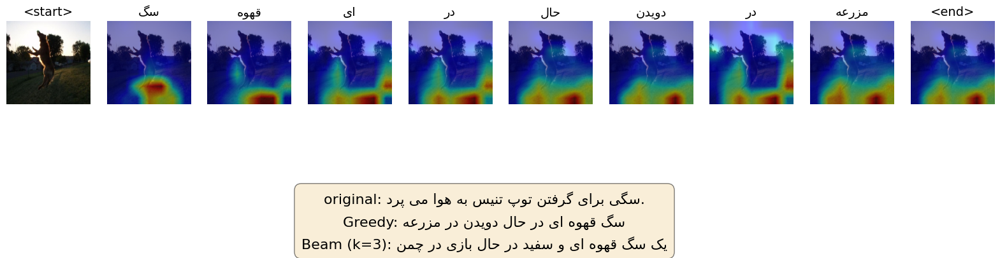

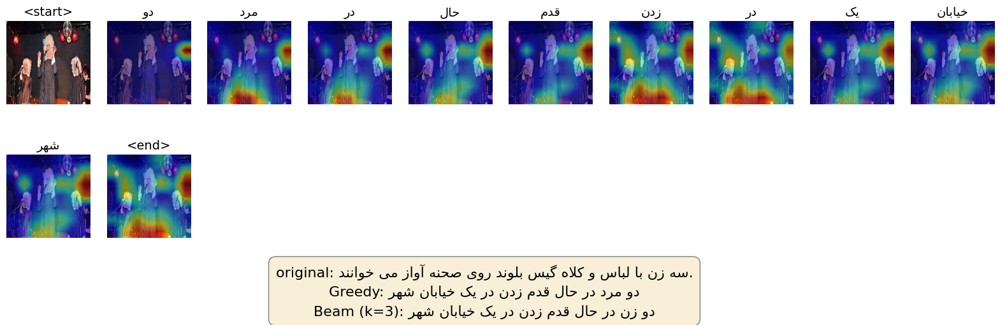

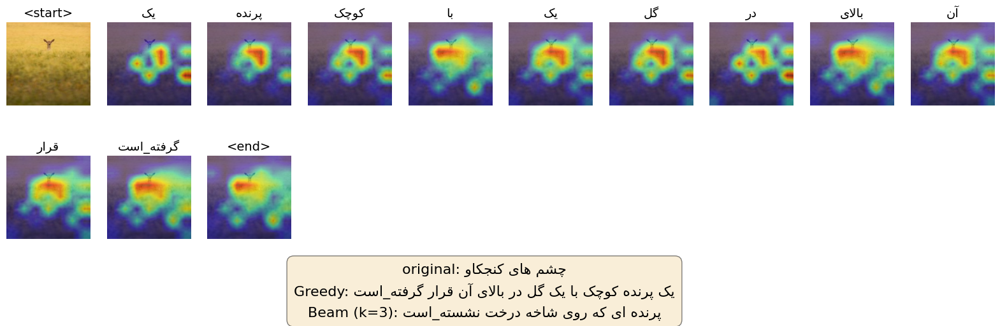

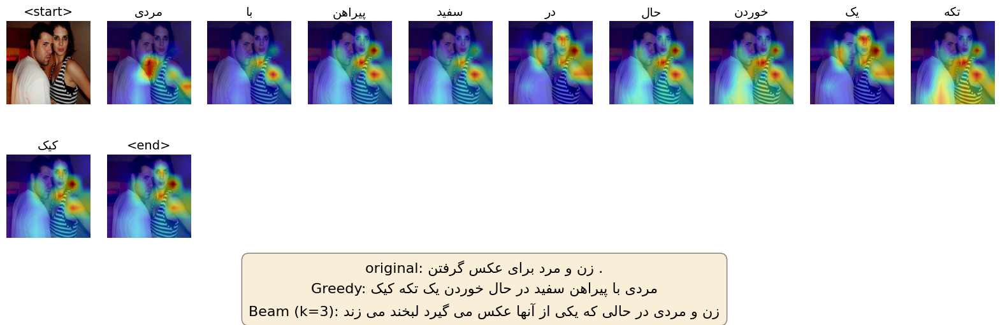

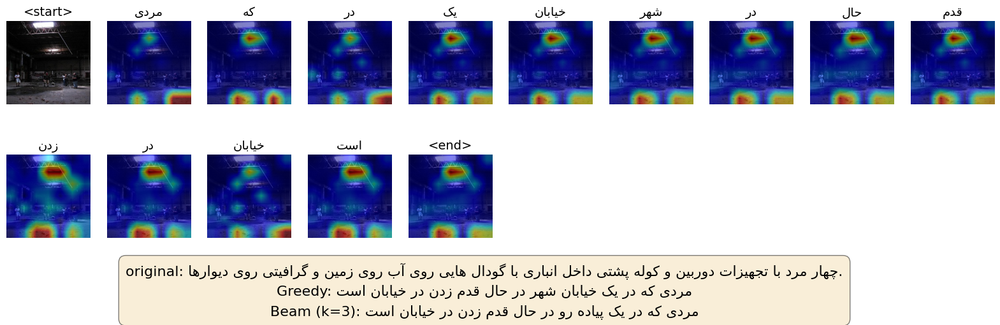

In [ ]:
# ==============================================================================
# FINAL, UNIFIED SCRIPT FOR EVALUATION AND VISUALIZATION
# ==============================================================================


# --- Use a font that supports Persian characters ---
plt.rcParams['font.family'] = 'DejaVu Sans'


# ==============================================================================
# HELPER FUNCTIONS FOR INFERENCE AND VISUALIZATION
# ==============================================================================

def preprocess_for_inference(image_path, target_size=(224, 224)):
    """Loads and preprocesses a single image to be fed into the model."""
    try:
        image = Image.open(image_path).convert('RGB')
        # This resizing method should match your preprocessing script
        image = image.resize(target_size, Image.Resampling.BICUBIC)
        image_numpy = np.array(image)
        image_tensor = torch.FloatTensor(image_numpy).permute(2, 0, 1) / 255.0
        return image_tensor.unsqueeze(0).to(device)
    except FileNotFoundError:
        return None

def get_predictions_and_attention(model_instance, image_tensor, word2idx_dict, idx2word_dict, device, beam_size=3, max_length=30):
    """
    Generates captions using both Greedy and Beam Search,
    and returns attention maps from the Greedy search.
    """
    model_instance.eval()

    # --- Greedy Search with Attention Logging ---
    greedy_caption_indices = [word2idx_dict['<start>']]
    attention_maps = []
    with torch.no_grad():
        encoder_out = model_instance.encoder(image_tensor.to(device))
        h, c = model_instance.decoder.init_hidden_state(encoder_out)
        for _ in range(max_length):
            previous_word_idx = torch.LongTensor([greedy_caption_indices[-1]]).to(device)
            embeddings = model_instance.decoder.embedding(previous_word_idx)
            context_vector, alpha = model_instance.decoder.attention(encoder_out, h)
            attention_maps.append(alpha.squeeze(0).cpu().numpy().reshape(7, 7))
            lstm_input = torch.cat((embeddings, context_vector), dim=1)
            h, c = model_instance.decoder.decode_step(lstm_input, (h, c))
            try:
                deep_output_input = (embeddings + model_instance.decoder.L_h(h) + model_instance.decoder.L_z(context_vector))
                preds = model_instance.decoder.fc(deep_output_input)
            except AttributeError:
                preds = model_instance.decoder.fc(h)
            predicted_idx = preds.argmax(1).item()
            greedy_caption_indices.append(predicted_idx)
            if predicted_idx == word2idx_dict['<end>']:
                break
    greedy_words = [idx2word_dict.get(idx, '<unk>') for idx in greedy_caption_indices]

    # --- Beam Search ---
    beam_words = model_instance.generate_caption_beam_search(image_tensor, word2idx_dict, idx2word_dict, beam_size=beam_size, max_length=max_length)

    return greedy_words, beam_words, attention_maps


# ==============================================================================
# MAIN EXECUTION
# ==============================================================================

# --- 1. Load Model and Data ---
print("--- Step 1: Loading model and data... ---")
drive.mount('/content/drive', force_remount=True)

# Define paths

CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/best_model.pth.tar'
LOCAL_NPZ_PATH = '/content/captions_and_vocab.npz'
RAW_CSV_PATH = '/content/dataset/dataset/data.csv'
PROCESSED_IMAGE_DIR = '/content/extracted_images/'

# Load all necessary data
try:
    npz_data = np.load(LOCAL_NPZ_PATH, allow_pickle=True)
    word2idx, idx2word, image_names = npz_data['word2idx'].item(), npz_data['idx2word'].item(), npz_data['image_names']
    original_captions_df = pd.read_csv(RAW_CSV_PATH)
    image_name_to_caption = pd.Series(original_captions_df.text.values, index=original_captions_df.image).to_dict()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Build and load the trained model
    model_params = { 'embed_dim': 256, 'decoder_dim': 512, 'attention_dim': 256, 'encoder_dim': 2560, 'dropout': 0.5 }
    model = ImageCaptioningModel(vocab_size=len(word2idx), **model_params).to(device)
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    print("✅ Model and data loaded successfully.")
except Exception as e:
    print(f"❌ ERROR during setup: {e}")
    print("Please make sure all previous steps (preprocessing, training) were successful and all files exist.")
    raise

# --- 2. Evaluate a Subset to Find Worst Samples ---
print("\n--- Step 2: Evaluating 100 random samples to find worst performers... ---")
num_eval_samples = 100
total_samples = len(image_names)
if num_eval_samples > total_samples:
    num_eval_samples = total_samples

random_indices_to_check = random.sample(range(total_samples), num_eval_samples)
evaluation_results = []

for idx in tqdm(random_indices_to_check, desc="Evaluating samples"):
    image_filename = image_names[idx]
    image_path = os.path.join(PROCESSED_IMAGE_DIR, image_filename)

    input_tensor = preprocess_for_inference(image_path)
    if input_tensor is None: continue

    hypothesis_words = model.generate_caption_greedy(input_tensor, word2idx, idx2word)
    hypothesis_tokens = hypothesis_words[1:-1]

    gt_caption_text = image_name_to_caption.get(image_filename, "")
    reference_tokens = clean_tokenize_caption(gt_caption_text)

    bleu4_score = sentence_bleu([reference_tokens], hypothesis_tokens, weights=(0.25, 0.25, 0.25, 0.25))
    evaluation_results.append({'score': bleu4_score, 'filename': image_filename, 'gt_caption': gt_caption_text})

evaluation_results.sort(key=lambda x: x['score'])
worst_samples = evaluation_results[:5]
print("✅ Evaluation complete. 5 worst performing samples identified.")


# --- 3. Visualize the 5 Worst Samples ---
print("\n--- Step 3: Visualizing attention for the 5 worst-performing samples... ---")
for sample in worst_samples:
    filename = sample['filename']
    gt_caption = sample['gt_caption']
    score = sample['score']

    processed_image_path = os.path.join(PROCESSED_IMAGE_DIR, filename)

    print("\n" + "="*80)
    display(HTML(f"<h3>Visualizing for image: {filename} (BLEU-4 Score: {score:.4f})</h3>"))

    input_tensor = preprocess_for_inference(processed_image_path)
    if input_tensor is None:
        print("Could not process this image.")
        continue

    # Generate captions and attention maps using the helper function
    greedy_words, beam_words, attention_maps = get_predictions_and_attention(model, input_tensor, word2idx, idx2word, device)

    # --- Plotting Section ---
    display_image = Image.open(processed_image_path)
    fig = plt.figure(figsize=(20, 5))
    for t in range(len(greedy_words)):
        rows = (len(greedy_words) + 9) // 10
        cols = 10
        if rows == 0: rows = 1
        ax = fig.add_subplot(rows, cols, t + 1)
        ax.imshow(display_image)
        ax.axis('off')
        if t > 0 and t-1 < len(attention_maps):
            attention_map_resized = cv2.resize(attention_maps[t-1], (224, 224))
            ax.imshow(attention_map_resized, cmap='jet', alpha=0.5)
        bidi_word = get_display(arabic_reshaper.reshape(greedy_words[t]))
        ax.set_title(bidi_word, fontsize=14)

    # Prepare text block for display below the plot
    greedy_caption_text = ' '.join(greedy_words[1:-1])
    beam_caption_text = ' '.join(beam_words[1:-1])
    text_block = (f"original: {gt_caption}\n"
                  f"Greedy: {greedy_caption_text}\n"
                  f"Beam (k=3): {beam_caption_text}")
    reshaped_text = arabic_reshaper.reshape(text_block)
    bidi_text = get_display(reshaped_text)

    fig.text(0.5, -0.1, bidi_text, ha="center", va="bottom", wrap=True,
             fontsize=16, linespacing=1.5,
             bbox=dict(boxstyle="round,pad=0.5", fc="wheat", alpha=0.5))

    plt.show()

In [ ]:
class DecoderWithAttention(nn.Module):
    """
    Decoder model with an attention mechanism and a Deep Output Layer.
    """
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2560, dropout=0.5):
        super(DecoderWithAttention, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size

        self.attention = AdditiveAttention(encoder_dim, decoder_dim, attention_dim)
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()

        self.L_h = nn.Linear(decoder_dim, embed_dim)
        self.L_z = nn.Linear(encoder_dim, embed_dim)

        self.fc = nn.Linear(embed_dim, vocab_size)

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)
        return h, c



    def forward(self, encoder_out, encoded_captions, caption_lengths, epsilon=1.0):
        """
        Forward pass with Scheduled Sampling.
        epsilon: The probability of using the ground truth word.
        """
        batch_size = encoder_out.size(0)
        device = encoder_out.device


        caption_lengths, sort_ind = caption_lengths.sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]


        embeddings = self.embedding(encoded_captions)

        h, c = self.init_hidden_state(encoder_out)

        decode_lengths = [l - 1 for l in caption_lengths]
        predictions = torch.zeros(batch_size, max(decode_lengths), self.vocab_size).to(device)


        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])


            use_ground_truth = random.random() < epsilon

            if t > 0 and not use_ground_truth:

                _, predicted_word_idx = preds[:batch_size_t].max(dim=1)
                current_embedding = self.embedding(predicted_word_idx)
            else:

                current_embedding = embeddings[:batch_size_t, t, :]


            context_vector, alpha = self.attention(encoder_out[:batch_size_t], h[:batch_size_t])


            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
            context_vector = gate * context_vector

            lstm_input = torch.cat((current_embedding, context_vector), dim=1)
            h, c = self.decode_step(lstm_input, (h[:batch_size_t], c[:batch_size_t]))


            deep_output_input = (
                current_embedding +
                self.L_h(h) +                    # L_h * h_t
                self.L_z(context_vector)         # L_z * z_t
            )

            preds = self.fc(self.dropout(deep_output_input))
            predictions[:batch_size_t, t, :] = preds



        return predictions, encoded_captions, decode_lengths, None

In [ ]:
class ImageCaptioningModel(nn.Module):
    """
    A single, unified model that combines the Encoder and Decoder.
    Now includes both Greedy and Beam Search generation methods.
    """
    def __init__(self, embed_dim, decoder_dim, attention_dim, vocab_size, encoder_dim, finetune_encoder=False, dropout=0.5):
        super(ImageCaptioningModel, self).__init__()
        self.encoder = Encoder(finetune=finetune_encoder)
        self.decoder = DecoderWithAttention(
            attention_dim=attention_dim,
            embed_dim=embed_dim,
            decoder_dim=decoder_dim,
            vocab_size=vocab_size,
            encoder_dim=encoder_dim,
            dropout=dropout
        )

    def forward(self, images, encoded_captions, caption_lengths, epsilon=1.0):
        """
        The forward pass for training (uses teacher forcing).
        """
        features = self.encoder(images)
        outputs = self.decoder(features, encoded_captions, caption_lengths , epsilon)
        return outputs

    def generate_caption_greedy(self, image_tensor, word2idx, idx2word, max_length=50):
        """
        Generates a caption for a single image using GREEDY SEARCH.
        (Corrected to use the Deep Output Layer)
        """
        self.eval()
        device = image_tensor.device
        caption_indices = [word2idx['<start>']]

        with torch.no_grad():
            encoder_out = self.encoder(image_tensor)
            h, c = self.decoder.init_hidden_state(encoder_out)

            for _ in range(max_length):
                previous_word_idx = torch.LongTensor([caption_indices[-1]]).to(device)
                embeddings = self.decoder.embedding(previous_word_idx)
                context_vector, _ = self.decoder.attention(encoder_out, h)

                lstm_input = torch.cat((embeddings, context_vector), dim=1)
                h, c = self.decoder.decode_step(lstm_input, (h, c))



                deep_output_input = (
                    embeddings +
                    self.decoder.L_h(h) +
                    self.decoder.L_z(context_vector)
                )

                preds = self.decoder.fc(deep_output_input)

                predicted_idx = preds.argmax(1).item()
                caption_indices.append(predicted_idx)

                if predicted_idx == word2idx['<end>']:
                    break

        caption_words = [idx2word.get(idx, '<unk>') for idx in caption_indices]
        return caption_words



    def generate_caption_beam_search(self, image_tensor, word2idx, idx2word, beam_size=3, max_length=50):
        """
        Generates a caption for a single image using BEAM SEARCH.
        (Corrected for hidden state bug, Deep Output Layer, and simplified logic)
        """
        self.eval()
        device = image_tensor.device
        vocab_size = len(word2idx)

        with torch.no_grad():
            encoder_out = self.encoder(image_tensor)
            h, c = self.decoder.init_hidden_state(encoder_out)

            h = h.expand(beam_size, self.decoder.decoder_dim)
            c = c.expand(beam_size, self.decoder.decoder_dim)

            k_prev_words = torch.LongTensor([[word2idx['<start>']]] * beam_size).to(device)
            seqs = k_prev_words
            top_k_scores = torch.zeros(beam_size, 1).to(device)

            complete_seqs = list()
            complete_seqs_scores = list()

            for step in range(max_length):
                embeddings = self.decoder.embedding(k_prev_words).squeeze(1)
                context_vector, _ = self.decoder.attention(encoder_out, h)

                gate = self.decoder.sigmoid(self.decoder.f_beta(h))
                context_vector = gate * context_vector

                lstm_input = torch.cat((embeddings, context_vector), dim=1)
                h, c = self.decoder.decode_step(lstm_input, (h, c))

                deep_output_input = (embeddings + self.decoder.L_h(h) + self.decoder.L_z(context_vector))
                scores = self.decoder.fc(deep_output_input)
                scores = F.log_softmax(scores, dim=1)

                scores = top_k_scores.expand_as(scores) + scores

                if step == 0:
                    top_k_scores, top_k_words = scores[0].topk(beam_size, 0, True, True)
                else:
                    top_k_scores, top_k_words = scores.view(-1).topk(beam_size, 0, True, True)

                prev_beam_inds = top_k_words // vocab_size
                next_word_inds = top_k_words % vocab_size

                seqs = torch.cat((seqs[prev_beam_inds], next_word_inds.unsqueeze(1)), dim=1)


                incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if next_word != word2idx['<end>']]
                complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

                if len(complete_inds) > 0:
                    complete_seqs.extend(seqs[complete_inds].tolist())

                    complete_seqs_scores.extend([top_k_scores[i] / (step + 1) for i in complete_inds])

                beam_size = len(incomplete_inds)
                if beam_size == 0:
                    break

                seqs = seqs[incomplete_inds]
                h = h[prev_beam_inds[incomplete_inds]]
                c = c[prev_beam_inds[incomplete_inds]]
                encoder_out = encoder_out if encoder_out.size(0) == beam_size else encoder_out[:beam_size]
                top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
                k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        if len(complete_seqs) == 0:
            best_seq_indices = seqs[0].tolist()
        else:
            best_seq_index = complete_seqs_scores.index(max(complete_seqs_scores))
            best_seq_indices = complete_seqs[best_seq_index]

        caption_words = [idx2word.get(idx, '<unk>') for idx in best_seq_indices]
        return caption_words


--- Using device: cuda ---
--- Loading preprocessed data... ---
--- Creating DataLoaders from individual image files... ---
--- DataLoaders created successfully. ---
--- Checkpoint found at '/content/drive/MyDrive/ImageCaptioning/SS_best_model.pth.tar'! Resuming training... ---
--- Resuming from epoch 1. Best BLEU-4 so far: 0.0266 ---

--- Starting Training ---

--- Epoch 2/70 ---
--- Using Epsilon for this epoch: 0.9929 ---


Evaluating: 100%|██████████| 63/63 [03:38<00:00,  3.47s/it]



--- Random Validation Example ---


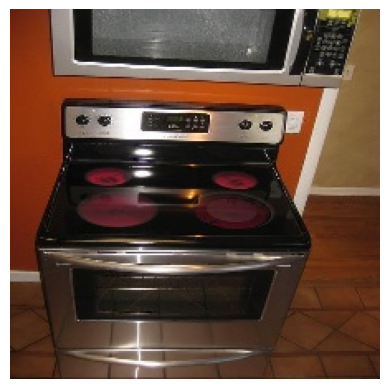

  Real Caption: یک اجاق گاز نقره ای و مشکی روی کف کاشی در آشپزخانه
  Generated Caption: یک میز با یک میز با یک میز چوبی و یک میز
---------------------------------
Epoch Summary: Train Loss: 3.5881 | Val Loss: 3.2938 | BLEU-1: 0.2086 | BLEU-4: 0.0322
--- Current Learning Rate: 0.001 ---
New best model saved with BLEU-4: 0.0322

--- Epoch 3/70 ---
--- Using Epsilon for this epoch: 0.9857 ---


Evaluating: 100%|██████████| 63/63 [03:42<00:00,  3.53s/it]



--- Random Validation Example ---


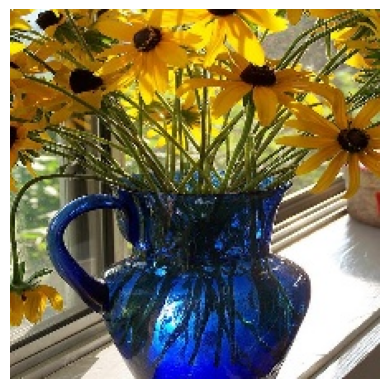

  Real Caption: یک گلدان آبی بزرگ با تعداد زیادی گل <unk> در آن
  Generated Caption: یک میز با یک بشقاب سفید و یک بشقاب سفید
---------------------------------
Epoch Summary: Train Loss: 3.3282 | Val Loss: 3.1746 | BLEU-1: 0.2065 | BLEU-4: 0.0338
--- Current Learning Rate: 0.001 ---
New best model saved with BLEU-4: 0.0338

--- Epoch 4/70 ---
--- Using Epsilon for this epoch: 0.9786 ---


Evaluating: 100%|██████████| 63/63 [03:41<00:00,  3.52s/it]



--- Random Validation Example ---


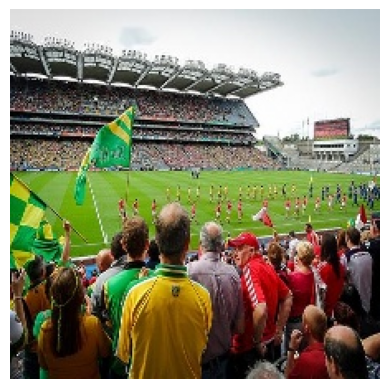

  Real Caption: مردم در حال تماشای بازی بازیکنان در زمین هستند
  Generated Caption: گروهی از مردم در حال تماشای یک قایق رانی در یک روز آفتابی
---------------------------------
Epoch Summary: Train Loss: 3.1732 | Val Loss: 3.1224 | BLEU-1: 0.2008 | BLEU-4: 0.0310
--- Current Learning Rate: 0.001 ---
No improvement in validation BLEU-4 for 1 epochs.

--- Epoch 5/70 ---
--- Using Epsilon for this epoch: 0.9714 ---


Evaluating: 100%|██████████| 63/63 [03:42<00:00,  3.54s/it]



--- Random Validation Example ---


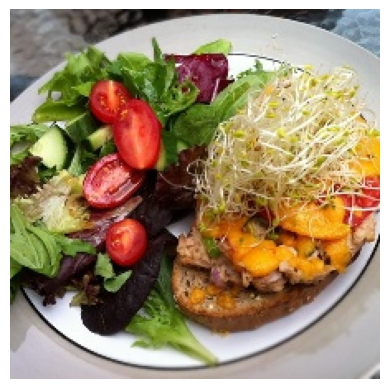

  Real Caption: یک بشقاب غذا یک سالاد و مقداری جوانه دارد
  Generated Caption: یک بشقاب سبزیجات و سبزیجات در یک کاسه
---------------------------------
Epoch Summary: Train Loss: 3.0343 | Val Loss: 3.1067 | BLEU-1: 0.2039 | BLEU-4: 0.0323
--- Current Learning Rate: 0.001 ---
No improvement in validation BLEU-4 for 2 epochs.

--- Epoch 6/70 ---
--- Using Epsilon for this epoch: 0.9643 ---


Evaluating: 100%|██████████| 63/63 [03:41<00:00,  3.51s/it]



--- Random Validation Example ---


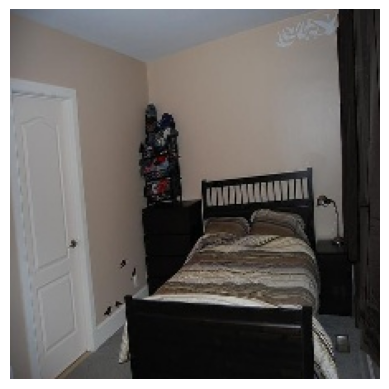

  Real Caption: یک اتاق خواب دارای یک تخت و کشو سیاه است
  Generated Caption: یک تخت با یک صفحه تخت یک تخت
---------------------------------
Epoch Summary: Train Loss: 2.9264 | Val Loss: 3.1129 | BLEU-1: 0.2004 | BLEU-4: 0.0315
--- Current Learning Rate: 0.001 ---
No improvement in validation BLEU-4 for 3 epochs.

--- Epoch 7/70 ---
--- Using Epsilon for this epoch: 0.9571 ---


Evaluating: 100%|██████████| 63/63 [03:38<00:00,  3.47s/it]



--- Random Validation Example ---


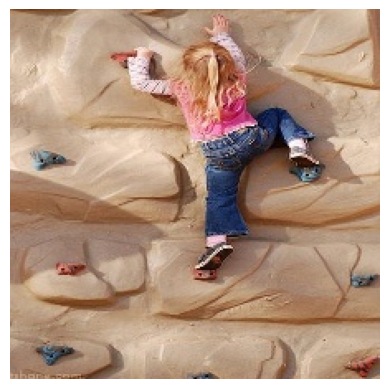

  Real Caption: یک دختر جوان بلوند در حال بالا رفتن از یک صخره است
  Generated Caption: یک کودک کوچک در حال بازی بیسبال در زمین بیسبال
---------------------------------
Epoch Summary: Train Loss: 2.8424 | Val Loss: 3.1321 | BLEU-1: 0.2061 | BLEU-4: 0.0333
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 4 epochs.

--- Epoch 8/70 ---
--- Using Epsilon for this epoch: 0.9500 ---


Evaluating: 100%|██████████| 63/63 [03:42<00:00,  3.54s/it]



--- Random Validation Example ---


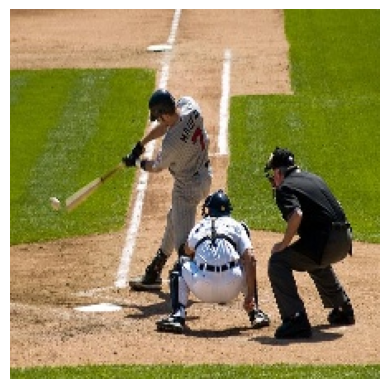

  Real Caption: این زاویه پشت دو <unk> و یک بازیکن بیسبال است که با چوب خود به توپ ضربه می زند
  Generated Caption: بازیکن بیسبال در حال خفاش در زمین بیسبال
---------------------------------
Epoch Summary: Train Loss: 2.5498 | Val Loss: 3.1244 | BLEU-1: 0.1967 | BLEU-4: 0.0313
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 5 epochs.

--- Epoch 9/70 ---
--- Using Epsilon for this epoch: 0.9429 ---


Evaluating: 100%|██████████| 63/63 [03:40<00:00,  3.50s/it]



--- Random Validation Example ---


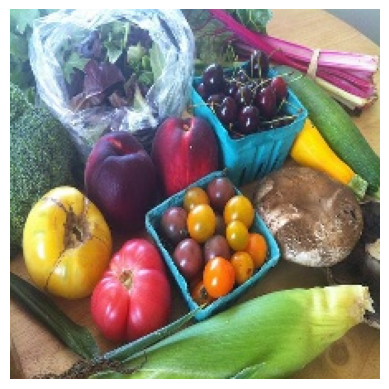

  Real Caption: یک میز پر از میوه و سبزیجات رنگارنگ
  Generated Caption: یک کاسه میوه با یک سیب و سیب و سیب
---------------------------------
Epoch Summary: Train Loss: 2.4946 | Val Loss: 3.1519 | BLEU-1: 0.2003 | BLEU-4: 0.0318
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 6 epochs.

--- Epoch 10/70 ---
--- Using Epsilon for this epoch: 0.9357 ---


Evaluating: 100%|██████████| 63/63 [03:42<00:00,  3.53s/it]



--- Random Validation Example ---


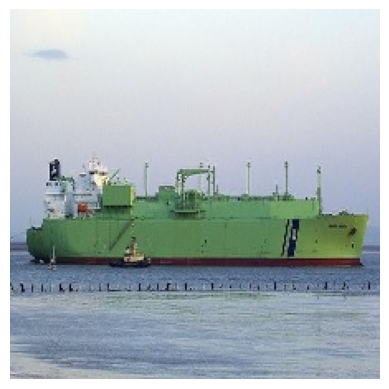

  Real Caption: یک کشتی <unk> سبز رنگ بزرگ با یک قایق یدک کش در کنار آن
  Generated Caption: قایق بادبانی قایق هایی در آب شناور است
---------------------------------
Epoch Summary: Train Loss: 2.4431 | Val Loss: 3.1768 | BLEU-1: 0.1941 | BLEU-4: 0.0305
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 7 epochs.

--- Epoch 11/70 ---
--- Using Epsilon for this epoch: 0.9286 ---


Evaluating: 100%|██████████| 63/63 [03:41<00:00,  3.52s/it]



--- Random Validation Example ---


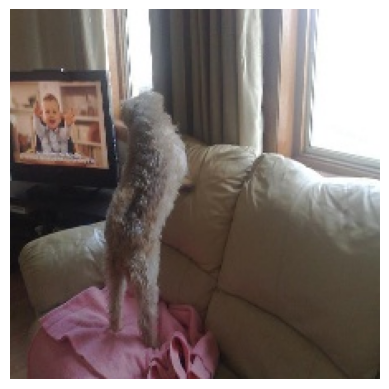

  Real Caption: توله سگ در حالی که رو به تلویزیون است از روی مبل بالا می رود
  Generated Caption: گربه ای که روی تخت دراز کشیده_است
---------------------------------
Epoch Summary: Train Loss: 2.4096 | Val Loss: 3.2028 | BLEU-1: 0.1934 | BLEU-4: 0.0303
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 8 epochs.

--- Epoch 12/70 ---
--- Using Epsilon for this epoch: 0.9214 ---


Evaluating: 100%|██████████| 63/63 [03:45<00:00,  3.58s/it]



--- Random Validation Example ---


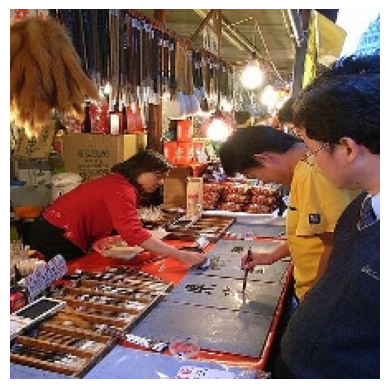

  Real Caption: افرادی که به خط چینی می نویسند
  Generated Caption: مردی با پیراهن قرمز در حال کار با <unk> در در قطار است
---------------------------------
Epoch Summary: Train Loss: 2.3509 | Val Loss: 3.2122 | BLEU-1: 0.1907 | BLEU-4: 0.0283
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 9 epochs.

--- Epoch 13/70 ---
--- Using Epsilon for this epoch: 0.9143 ---


Evaluating: 100%|██████████| 63/63 [03:41<00:00,  3.52s/it]



--- Random Validation Example ---


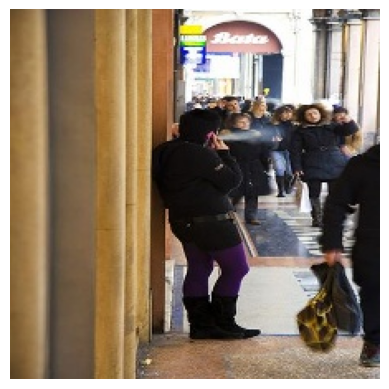

  Real Caption: زنی با شلوارهای ساق بنفش و جک مشکی جلوی ساختمانی در شهری شلوغ ایستاده و سیگار می کشد
  Generated Caption: مردی با گربه ای که روی کاناپه نشسته و گربه ای رنگی که روی کاناپه نشسته_است
---------------------------------
Epoch Summary: Train Loss: 2.3386 | Val Loss: 3.2179 | BLEU-1: 0.1931 | BLEU-4: 0.0294
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 10 epochs.

--- Epoch 14/70 ---
--- Using Epsilon for this epoch: 0.9071 ---


Evaluating: 100%|██████████| 63/63 [03:41<00:00,  3.52s/it]



--- Random Validation Example ---


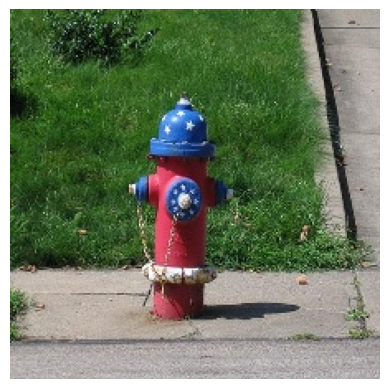

  Real Caption: یک شیر آتش نشانی قرمز و آبی که در وسط یک پیاده رو نشسته_است
  Generated Caption: شیر آتش نشانی قرمز در پارک است
---------------------------------
Epoch Summary: Train Loss: 2.3600 | Val Loss: 3.2217 | BLEU-1: 0.1929 | BLEU-4: 0.0294
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 11 epochs.

--- Epoch 15/70 ---
--- Using Epsilon for this epoch: 0.9000 ---


Evaluating: 100%|██████████| 63/63 [03:42<00:00,  3.53s/it]



--- Random Validation Example ---


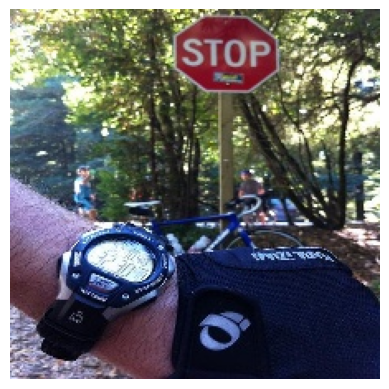

  Real Caption: یک ساعت <unk> <unk> در پیش زمینه <unk> ٫ <unk> را نشان می دهد در حالی که یک دوچرخه و یک علامت توقف در پس زمینه است
  Generated Caption: شخصی که عینک و عینک آفتابی و در کنار درختان
---------------------------------
Epoch Summary: Train Loss: 2.4085 | Val Loss: 3.2225 | BLEU-1: 0.1902 | BLEU-4: 0.0286
--- Current Learning Rate: 8.000000000000001e-06 ---
No improvement in validation BLEU-4 for 12 epochs.
Early stopping triggered after 12 epochs with no improvement.

--- Training finished. Loading best model and running on test set... ---


Evaluating: 100%|██████████| 63/63 [03:34<00:00,  3.40s/it]



--- FINAL TEST RESULTS ---
Test Loss: 3.1685 | Test BLEU-1: 0.2041 | Test BLEU-4: 0.0322


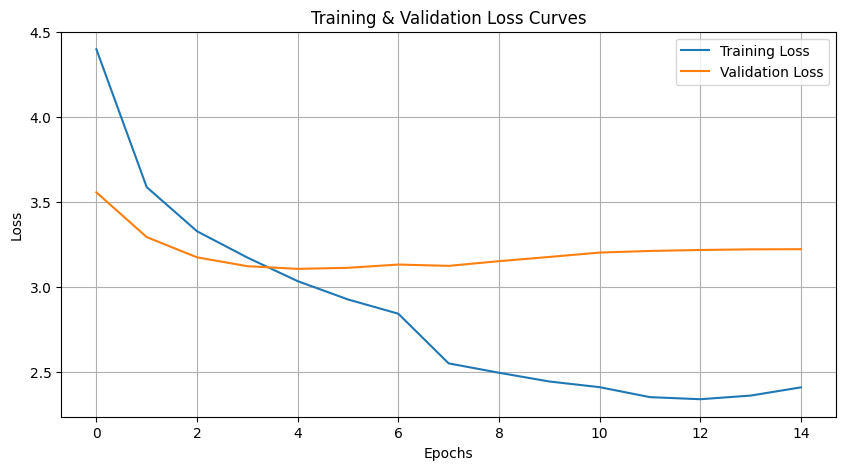

In [ ]:
# --- PART 1: CONFIGURATION ---

NPZ_PATH = '/content/captions_and_vocab.npz'
CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/SS_best_model.pth.tar'

CHECKPOINT_DIR = os.path.dirname(CHECKPOINT_PATH)

os.makedirs(CHECKPOINT_DIR, exist_ok=True)

params = {
    'num_samples': None,
    'epochs': 70,
    'batch_size': 64,
    'learning_rate': 0.001,
    'weight_decay': 0.00001,
    'lr_patience': 3,
    'early_stop_patience': 12
}

model_params = {
    'embed_dim': 256,
    'decoder_dim': 512,
    'attention_dim': 256,
    'encoder_dim': 2560,
    'dropout': 0.6,
    'finetune_encoder': False
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"--- Using device: {device} ---")


# =====================================================================================
# PART 2: DATA LOADING AND PREPARATION
# =====================================================================================
print("--- Loading preprocessed data... ---")
npz_data = np.load(NPZ_PATH, allow_pickle=True)
captions = npz_data['captions']
image_names = npz_data['image_names']
word2idx = npz_data['word2idx'].item()
idx2word = npz_data['idx2word'].item()
vocab_size = len(word2idx)

if params['num_samples'] is not None:
    print(f"--- Running in test mode: Using {params['num_samples']} samples. ---")
    captions = captions[:params['num_samples']]

indices = list(range(len(captions)))
train_indices, temp_indices = train_test_split(indices, test_size=0.2, random_state=42)
val_indices, test_indices = train_test_split(temp_indices, test_size=0.5, random_state=42)


class ImageFileDataset(Dataset):
    def __init__(self, image_dir, all_captions, all_image_names, indices, transform=None):
        self.image_dir = image_dir
        self.transform = transform


        self.indices = indices
        self.captions = [all_captions[i] for i in indices]
        self.image_names = [all_image_names[i] for i in indices]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):

        image_filename = self.image_names[idx]
        img_path = os.path.join(self.image_dir, image_filename)


        image = Image.open(img_path).convert('RGB')
        image_numpy = np.array(image)
        image_tensor = torch.FloatTensor(image_numpy).permute(2, 0, 1) / 255.0

        if self.transform:
            image_tensor = self.transform(image_tensor)

        caption = torch.LongTensor(self.captions[idx])
        caption_length = torch.LongTensor([len(caption)])

        return image_tensor, caption, caption_length

def collate_fn(batch):
    batch.sort(key=lambda x: x[2], reverse=True)
    images, captions, lengths = zip(*batch)
    images = torch.stack(images, 0)
    padded_captions = nn.utils.rnn.pad_sequence(captions, batch_first=True, padding_value=word2idx['<pad>'])
    lengths = torch.tensor(lengths, dtype=torch.long)
    return images, padded_captions, lengths

IMAGE_DIR = '/content/extracted_images/'

print("--- Creating DataLoaders from individual image files... ---")

train_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, train_indices)
val_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, val_indices)
test_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, test_indices)

train_loader = DataLoader(train_dataset, batch_size=params['batch_size'], shuffle=True, num_workers=2, pin_memory=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=params['batch_size'], shuffle=False, num_workers=2, pin_memory=True, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=params['batch_size'], shuffle=False, num_workers=2, pin_memory=True, collate_fn=collate_fn)
print("--- DataLoaders created successfully. ---")


# =====================================================================================
# PART 3: HELPER FUNCTIONS FOR TRAINING AND EVALUATION
# =====================================================================================

def train_epoch(model, loader, optimizer, criterion , epoch_num, total_epochs ):
    model.train()
    total_loss = 0.0


    start_decay_epoch = 0
    end_decay_epoch = total_epochs

    start_epsilon = 1.0
    end_epsilon = 0.5

    if epoch_num < start_decay_epoch:
        epsilon = start_epsilon
    elif epoch_num > end_decay_epoch:
        epsilon = end_epsilon
    else:
        decay_range = start_epsilon - end_epsilon
        progress = (epoch_num - start_decay_epoch) / (end_decay_epoch - start_decay_epoch)
        epsilon = start_epsilon - (progress * decay_range)

    print(f"--- Using Epsilon for this epoch: {epsilon:.4f} ---")


    for imgs, caps, caplens in tqdm(loader, desc="Training"):
        imgs, caps = imgs.to(device), caps.to(device)

        optimizer.zero_grad()

        outputs, caps_sorted, decode_lengths, _ = model(imgs, caps, caplens , epsilon )
        targets = caps_sorted[:, 1:] # Targets are captions without <start> token
        # Pack outputs and targets to ignore padding in loss calculation
        packed_outputs = nn.utils.rnn.pack_padded_sequence(outputs, decode_lengths, batch_first=True).data
        packed_targets = nn.utils.rnn.pack_padded_sequence(targets, decode_lengths, batch_first=True).data
        loss = criterion(packed_outputs, packed_targets)

        loss.backward()

        # Clip gradients to prevent exploding
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)

        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)


def evaluate(model, loader, criterion, word2idx, idx2word, show_example=False):
    model.eval()
    total_loss = 0.0
    references, hypotheses = [], []

    with torch.no_grad():
        for i, (imgs, caps, caplens) in enumerate(tqdm(loader, desc="Evaluating")):
            imgs_val, caps_val = imgs.to(device), caps.to(device)

            # --- Loss Calculation (unchanged) ---
            outputs, caps_sorted, decode_lengths, _ = model(imgs_val, caps_val, caplens)
            targets = caps_sorted[:, 1:]
            packed_outputs = nn.utils.rnn.pack_padded_sequence(outputs, decode_lengths, batch_first=True).data
            packed_targets = nn.utils.rnn.pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            loss = criterion(packed_outputs, packed_targets)
            total_loss += loss.item()

            # --- BLEU Score Preparation (unchanged) ---
            # Real captions (references)
            all_caps_indices = caps.cpu().numpy()
            for cap_indices in all_caps_indices:
                real_words = [idx2word.get(idx, '<unk>') for idx in cap_indices if idx not in {word2idx['<start>'], word2idx['<end>'], word2idx['<pad>']}]
                references.append([real_words])

            # Generated captions (hypotheses)
            for img_tensor in imgs_val:
                generated_words = model.generate_caption_greedy(img_tensor.unsqueeze(0), word2idx, idx2word)
                hypotheses.append(generated_words[1:-1])

    # Calculate BLEU scores
    bleu1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0))
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    # --- CORRECTED EXAMPLE DISPLAY LOGIC ---
    if show_example:
        # Get a random index from the validation set
        random_idx_in_val_set = random.randint(0, len(val_dataset) - 1)

        # Get the corresponding image and real caption
        img_example, cap_example, _ = val_dataset[random_idx_in_val_set]

        # Move image to device for generation
        img_example_tensor = img_example.unsqueeze(0).to(device)

        # Generate a caption for THIS specific image
        generated_caption_words = model.generate_caption_greedy(img_example_tensor, word2idx, idx2word)

        # Convert real caption indices to words
        real_caption_words = [idx2word.get(idx, '<unk>') for idx in cap_example.tolist() if idx not in {word2idx['<start>'], word2idx['<end>'], word2idx['<pad>']}]

        print(f"\n--- Random Validation Example ---")
        # Permute from (C,H,W) to (H,W,C) for plotting
        plt.imshow(img_example.permute(1, 2, 0))
        plt.axis('off')
        plt.show()
        print(f"  Real Caption: {' '.join(real_caption_words)}")
        print(f"  Generated Caption: {' '.join(generated_caption_words[1:-1])}") # Exclude <start>/<end>
        print(f"---------------------------------")

    return total_loss / len(loader), bleu1, bleu4


if __name__ == '__main__':
    model = ImageCaptioningModel(vocab_size=vocab_size, **model_params).to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=word2idx['<pad>'])
    optimizer = torch.optim.Adam(model.parameters(), lr=params['learning_rate'], weight_decay=params['weight_decay'])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=params['lr_patience'], factor=0.2, verbose=True)

    start_epoch = 0
    best_bleu4 = 0.0
    train_losses, val_losses = [], []

    if os.path.exists(CHECKPOINT_PATH):
        print(f"--- Checkpoint found at '{CHECKPOINT_PATH}'! Resuming training... ---")
        checkpoint = torch.load(CHECKPOINT_PATH)

        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        start_epoch = checkpoint['epoch']
        best_bleu4 = checkpoint['best_bleu4']
        train_losses = checkpoint['train_losses']
        val_losses = checkpoint['val_losses']

        print(f"--- Resuming from epoch {start_epoch}. Best BLEU-4 so far: {best_bleu4:.4f} ---")
    else:
        print(f"--- No checkpoint found at '{CHECKPOINT_PATH}'. Starting from scratch. ---")


    epochs_no_improve = 0
    print("\n--- Starting Training ---")

    for epoch in range(start_epoch, params['epochs']):
        print(f"\n--- Epoch {epoch+1}/{params['epochs']} ---")

        train_loss = train_epoch(model, train_loader, optimizer, criterion , epoch, params['epochs'])
        val_loss, bleu1, bleu4 = evaluate(model, val_loader, criterion, word2idx, idx2word, show_example=True)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        scheduler.step(bleu4)
        print(f"Epoch Summary: Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | BLEU-1: {bleu1:.4f} | BLEU-4: {bleu4:.4f}")
        current_lr = optimizer.param_groups[0]['lr']
        print(f"--- Current Learning Rate: {current_lr} ---")
        is_best = bleu4 > best_bleu4
        if is_best:
            best_bleu4 = bleu4
            epochs_no_improve = 0

            print(f"New best model saved with BLEU-4: {best_bleu4:.4f}")

            state = {
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'best_bleu4': best_bleu4,
                'train_losses': train_losses,
                'val_losses': val_losses
            }
            torch.save(state, CHECKPOINT_PATH)

        else:
            epochs_no_improve += 1
            print(f"No improvement in validation BLEU-4 for {epochs_no_improve} epochs.")

        if epochs_no_improve >= params['early_stop_patience']:
            print(f"Early stopping triggered after {params['early_stop_patience']} epochs with no improvement.")
            break


    # --- Final Test Evaluation ---
    print("\n--- Training finished. Loading best model and running on test set... ---")

    checkpoint = torch.load(CHECKPOINT_PATH)

    model.load_state_dict(checkpoint['model_state_dict'])

    test_loss, test_bleu1, test_bleu4 = evaluate(model, test_loader, criterion, word2idx, idx2word)
    print(f"\n--- FINAL TEST RESULTS ---")
    print(f"Test Loss: {test_loss:.4f} | Test BLEU-1: {test_bleu1:.4f} | Test BLEU-4: {test_bleu4:.4f}")

    # --- Plotting Loss Curves ---
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training & Validation Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

In [8]:
class ScaledDotProductAttention(nn.Module):
    """
    Scaled Dot-Product Attention mechanism.
    """
    def __init__(self, encoder_dim, decoder_dim, attention_dim):

        super(ScaledDotProductAttention, self).__init__()

        self.query_proj = nn.Linear(decoder_dim, encoder_dim)

        self.scale = torch.sqrt(torch.FloatTensor([encoder_dim]))

        self.softmax = nn.Softmax(dim=2)

    def forward(self, encoder_out, decoder_hidden):
        """
        encoder_out (Key, Value): (batch_size, num_pixels, encoder_dim)
        decoder_hidden (Query): (batch_size, decoder_dim)
        """

        q = self.query_proj(decoder_hidden).unsqueeze(1)

        k = encoder_out
        v = encoder_out

        self.scale = self.scale.to(q.device)

        energy = torch.bmm(q, k.transpose(1, 2)) / self.scale

        alpha = self.softmax(energy)

        context_vector = torch.bmm(alpha, v)

        context_vector = context_vector.squeeze(1) # -> (batch_size, encoder_dim)
        alpha = alpha.squeeze(1) # -> (batch_size, num_pixels)

        return context_vector, alpha

In [7]:
class DecoderWithAttention(nn.Module):
    """
    Decoder model with an attention mechanism and a Deep Output Layer.
    """
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2560, dropout=0.5):
        super(DecoderWithAttention, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size

        self.attention = ScaledDotProductAttention(encoder_dim, decoder_dim, attention_dim)
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True)

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()

        self.L_h = nn.Linear(decoder_dim, embed_dim)
        self.L_z = nn.Linear(encoder_dim, embed_dim)

        self.fc = nn.Linear(embed_dim, vocab_size)

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)
        device = encoder_out.device

        embeddings = self.embedding(encoded_captions)
        h, c = self.init_hidden_state(encoder_out)

        decode_lengths = [l - 1 for l in caption_lengths]
        predictions = torch.zeros(batch_size, max(decode_lengths), self.vocab_size).to(device)

        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])

            context_vector, alpha = self.attention(encoder_out[:batch_size_t], h[:batch_size_t])

            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
            context_vector = gate * context_vector

            lstm_input = torch.cat((embeddings[:batch_size_t, t, :], context_vector), dim=1)
            h, c = self.decode_step(lstm_input, (h[:batch_size_t], c[:batch_size_t]))

            deep_output_input = (
                embeddings[:batch_size_t, t, :] +  # E * y_{t-1}
                self.L_h(h) +                      # L_h * h_t
                self.L_z(context_vector)           # L_z * z_t
            )


            preds = self.fc(self.dropout(deep_output_input))

            predictions[:batch_size_t, t, :] = preds

        return predictions, encoded_captions, decode_lengths, None

In [12]:
class ImageCaptioningModel(nn.Module):
    """
    A single, unified model that combines the Encoder and Decoder.
    Now includes both Greedy and Beam Search generation methods.
    """
    def __init__(self, embed_dim, decoder_dim, attention_dim, vocab_size, encoder_dim, finetune_encoder=False, dropout=0.5):
        super(ImageCaptioningModel, self).__init__()
        self.encoder = Encoder(finetune=finetune_encoder)
        self.decoder = DecoderWithAttention(
            attention_dim=attention_dim,
            embed_dim=embed_dim,
            decoder_dim=decoder_dim,
            vocab_size=vocab_size,
            encoder_dim=encoder_dim,
            dropout=dropout
        )

    def forward(self, images, encoded_captions, caption_lengths):
        """
        The forward pass for training (uses teacher forcing).
        """
        features = self.encoder(images)
        outputs = self.decoder(features, encoded_captions, caption_lengths)
        return outputs

    def generate_caption_greedy(self, image_tensor, word2idx, idx2word, max_length=50):
        """
        Generates a caption for a single image using GREEDY SEARCH.
        (Corrected to use the Deep Output Layer)
        """
        self.eval()
        device = image_tensor.device
        caption_indices = [word2idx['<start>']]

        with torch.no_grad():
            encoder_out = self.encoder(image_tensor)
            h, c = self.decoder.init_hidden_state(encoder_out)

            for _ in range(max_length):
                previous_word_idx = torch.LongTensor([caption_indices[-1]]).to(device)
                embeddings = self.decoder.embedding(previous_word_idx)
                context_vector, _ = self.decoder.attention(encoder_out, h)

                lstm_input = torch.cat((embeddings, context_vector), dim=1)
                h, c = self.decoder.decode_step(lstm_input, (h, c))



                deep_output_input = (
                    embeddings +
                    self.decoder.L_h(h) +
                    self.decoder.L_z(context_vector)
                )

                preds = self.decoder.fc(deep_output_input)

                predicted_idx = preds.argmax(1).item()
                caption_indices.append(predicted_idx)

                if predicted_idx == word2idx['<end>']:
                    break

        caption_words = [idx2word.get(idx, '<unk>') for idx in caption_indices]
        return caption_words



    def generate_caption_beam_search(self, image_tensor, word2idx, idx2word, beam_size=3, max_length=50):
        """
        Generates a caption for a single image using BEAM SEARCH.
        (Corrected for hidden state bug, Deep Output Layer, and simplified logic)
        """
        self.eval()
        device = image_tensor.device
        vocab_size = len(word2idx)

        with torch.no_grad():
            encoder_out = self.encoder(image_tensor)
            h, c = self.decoder.init_hidden_state(encoder_out)

            h = h.expand(beam_size, self.decoder.decoder_dim)
            c = c.expand(beam_size, self.decoder.decoder_dim)
            encoder_out = encoder_out.expand(beam_size, -1, -1)
            k_prev_words = torch.LongTensor([[word2idx['<start>']]] * beam_size).to(device)
            seqs = k_prev_words
            top_k_scores = torch.zeros(beam_size, 1).to(device)

            complete_seqs = list()
            complete_seqs_scores = list()

            for step in range(max_length):
                embeddings = self.decoder.embedding(k_prev_words).squeeze(1)
                context_vector, _ = self.decoder.attention(encoder_out, h)

                gate = self.decoder.sigmoid(self.decoder.f_beta(h))
                context_vector = gate * context_vector

                lstm_input = torch.cat((embeddings, context_vector), dim=1)
                h, c = self.decoder.decode_step(lstm_input, (h, c))

                deep_output_input = (embeddings + self.decoder.L_h(h) + self.decoder.L_z(context_vector))
                scores = self.decoder.fc(deep_output_input)
                scores = F.log_softmax(scores, dim=1)

                scores = top_k_scores.expand_as(scores) + scores

                if step == 0:
                    top_k_scores, top_k_words = scores[0].topk(beam_size, 0, True, True)
                else:
                    top_k_scores, top_k_words = scores.view(-1).topk(beam_size, 0, True, True)

                prev_beam_inds = top_k_words // vocab_size
                next_word_inds = top_k_words % vocab_size

                seqs = torch.cat((seqs[prev_beam_inds], next_word_inds.unsqueeze(1)), dim=1)


                incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if next_word != word2idx['<end>']]
                complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

                if len(complete_inds) > 0:
                    complete_seqs.extend(seqs[complete_inds].tolist())

                    complete_seqs_scores.extend([top_k_scores[i] / (step + 1) for i in complete_inds])

                beam_size = len(incomplete_inds)
                if beam_size == 0:
                    break

                seqs = seqs[incomplete_inds]
                h = h[prev_beam_inds[incomplete_inds]]
                c = c[prev_beam_inds[incomplete_inds]]
                encoder_out = encoder_out if encoder_out.size(0) == beam_size else encoder_out[:beam_size]
                top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
                k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

        if len(complete_seqs) == 0:
            best_seq_indices = seqs[0].tolist()
        else:
            best_seq_index = complete_seqs_scores.index(max(complete_seqs_scores))
            best_seq_indices = complete_seqs[best_seq_index]

        caption_words = [idx2word.get(idx, '<unk>') for idx in best_seq_indices]
        return caption_words


--- Using device: cuda ---
--- Loading preprocessed data... ---
--- Creating DataLoaders from individual image files... ---
--- DataLoaders created successfully. ---


Downloading: "https://download.pytorch.org/models/efficientnet_b7_lukemelas-c5b4e57e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b7_lukemelas-c5b4e57e.pth
100%|██████████| 255M/255M [00:01<00:00, 173MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


--- Checkpoint found at '/content/drive/MyDrive/ImageCaptioning/SDP_best_model.pth.tar'! Resuming training... ---
--- Resuming from epoch 4. Best BLEU-4 so far: 0.0359 ---

--- Starting Training ---

--- Epoch 5/70 ---


Evaluating: 100%|██████████| 63/63 [03:28<00:00,  3.31s/it]



--- Random Validation Example ---


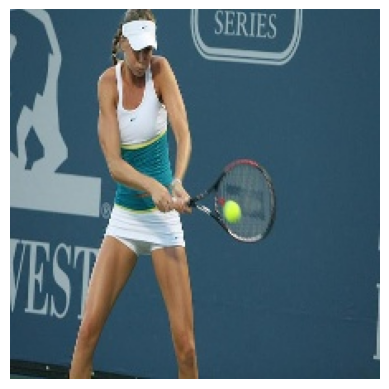

  Real Caption: تنیس باز زن در حال بالا آوردن راکت خود برای <unk> با توپ تنیس
  Generated Caption: تنیس تنیس تنیس ضربه بزند
---------------------------------
Epoch Summary: Train Loss: 3.0022 | Val Loss: 3.1073 | BLEU-1: 0.2141 | BLEU-4: 0.0337
--- Current Learning Rate: 0.001 ---
No improvement in validation BLEU-4 for 1 epochs.

--- Epoch 6/70 ---


Evaluating: 100%|██████████| 63/63 [03:28<00:00,  3.30s/it]



--- Random Validation Example ---


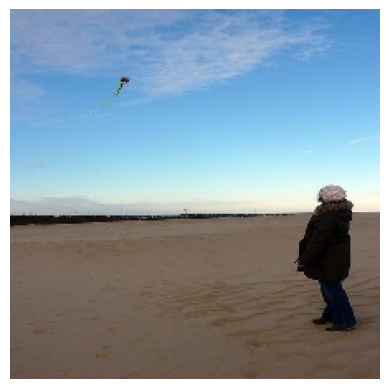

  Real Caption: خانمی که روی مقداری شن ایستاده_است
  Generated Caption: مردی با اسب سفید پوشیده از برف ایستاده_است
---------------------------------
Epoch Summary: Train Loss: 2.8623 | Val Loss: 3.1152 | BLEU-1: 0.2111 | BLEU-4: 0.0305
--- Current Learning Rate: 0.001 ---
No improvement in validation BLEU-4 for 2 epochs.

--- Epoch 7/70 ---


Evaluating: 100%|██████████| 63/63 [03:29<00:00,  3.32s/it]



--- Random Validation Example ---


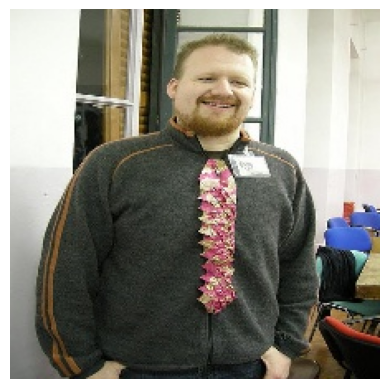

  Real Caption: مردی با ژاکت خاکستری و زرد با کراوات
  Generated Caption: مردی با کت کت و شلوار و کراوات آبی و سفید و کلاه ایمنی آبی و آبی و کلاه ایمنی آبی و سفید و کلاه ایمنی آبی و مشکی در دست دارد
---------------------------------
Epoch Summary: Train Loss: 2.7300 | Val Loss: 3.1400 | BLEU-1: 0.2036 | BLEU-4: 0.0295
--- Current Learning Rate: 0.001 ---
No improvement in validation BLEU-4 for 3 epochs.

--- Epoch 8/70 ---


Evaluating: 100%|██████████| 63/63 [03:29<00:00,  3.33s/it]



--- Random Validation Example ---


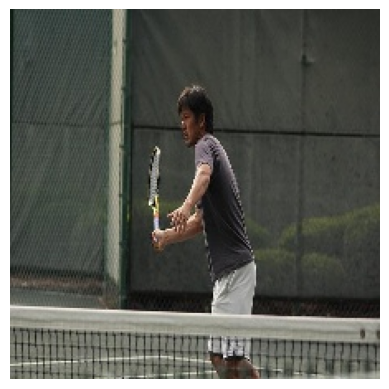

  Real Caption: مرد جوانی که یک راکت تنیس در دست دارد و در داخل زمین تنیس ایستاده_است
  Generated Caption: یک تنیس باز مرد در حال انجام یک بازی تنیس
---------------------------------
Epoch Summary: Train Loss: 2.5990 | Val Loss: 3.2047 | BLEU-1: 0.1888 | BLEU-4: 0.0265
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 4 epochs.

--- Epoch 9/70 ---


Evaluating: 100%|██████████| 63/63 [03:27<00:00,  3.30s/it]



--- Random Validation Example ---


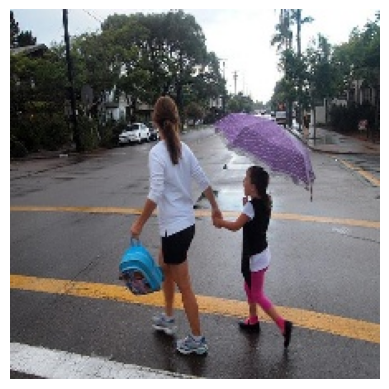

  Real Caption: مادری به دختر مدرسه ای کمک می کند تا از خیابان عبور کند
  Generated Caption: دو زن جوان تنیس بازی تنیس بازی تنیس بازی تنیس خود را در زمین تنیس بازی کنند
---------------------------------
Epoch Summary: Train Loss: 2.2847 | Val Loss: 3.2274 | BLEU-1: 0.1997 | BLEU-4: 0.0285
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 5 epochs.

--- Epoch 10/70 ---


Evaluating: 100%|██████████| 63/63 [03:27<00:00,  3.30s/it]



--- Random Validation Example ---


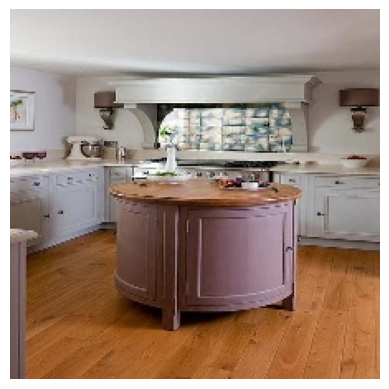

  Real Caption: یک منطقه آشپزخانه دوست داشتنی با جزیره ای بیضی شکل
  Generated Caption: یک آشپزخانه کوچک با اجاق گاز در کنار گاز خنک
---------------------------------
Epoch Summary: Train Loss: 2.1702 | Val Loss: 3.2715 | BLEU-1: 0.1991 | BLEU-4: 0.0284
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 6 epochs.

--- Epoch 11/70 ---


Evaluating: 100%|██████████| 63/63 [03:28<00:00,  3.32s/it]



--- Random Validation Example ---


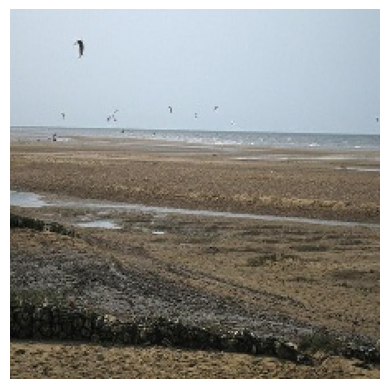

  Real Caption: انواع پرندگان بر فراز آب پرواز می کنند
  Generated Caption: پرندگان در ساحل شنی آب پرواز می کنند
---------------------------------
Epoch Summary: Train Loss: 2.0910 | Val Loss: 3.3134 | BLEU-1: 0.1980 | BLEU-4: 0.0284
--- Current Learning Rate: 0.0002 ---
No improvement in validation BLEU-4 for 7 epochs.

--- Epoch 12/70 ---


Evaluating: 100%|██████████| 63/63 [03:27<00:00,  3.29s/it]



--- Random Validation Example ---


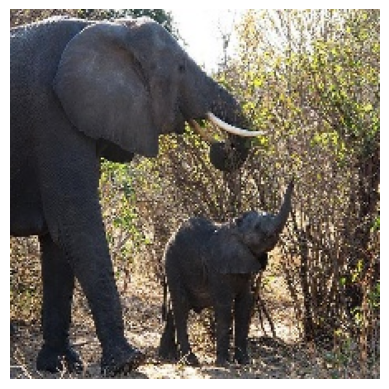

  Real Caption: مادر و بچه فیل در حال خوردن شاخه های بوته
  Generated Caption: یک فیل بزرگ و یک فیل با هم در یک مزرعه
---------------------------------
Epoch Summary: Train Loss: 2.0239 | Val Loss: 3.3765 | BLEU-1: 0.1969 | BLEU-4: 0.0264
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 8 epochs.

--- Epoch 13/70 ---


Evaluating: 100%|██████████| 63/63 [03:26<00:00,  3.28s/it]



--- Random Validation Example ---


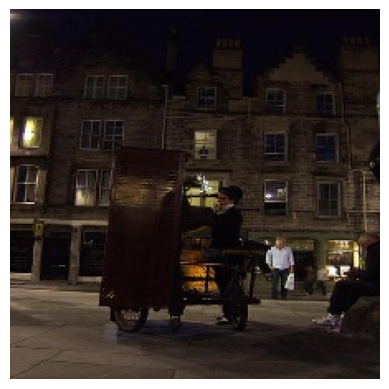

  Real Caption: مرد بلوند در حال عبور از خیابان با پیراهن سفید و تی شرت قرمز در حال حمل یک کیف سفید
  Generated Caption: یک کلیسای جامع در شب با ساختمان های زیادی در شب
---------------------------------
Epoch Summary: Train Loss: 1.9359 | Val Loss: 3.3912 | BLEU-1: 0.2000 | BLEU-4: 0.0278
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 9 epochs.

--- Epoch 14/70 ---


Evaluating: 100%|██████████| 63/63 [03:27<00:00,  3.30s/it]



--- Random Validation Example ---


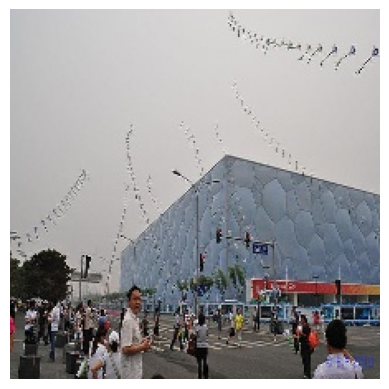

  Real Caption: انبوهی از مردم که بیرون ساختمان ایستاده_اند و بادبادک ها را به پرواز در می آورند
  Generated Caption: گروهی از مردم در یک منطقه شنی پرواز می کنند
---------------------------------
Epoch Summary: Train Loss: 1.9120 | Val Loss: 3.4045 | BLEU-1: 0.2001 | BLEU-4: 0.0286
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 10 epochs.

--- Epoch 15/70 ---


Evaluating: 100%|██████████| 63/63 [03:28<00:00,  3.32s/it]



--- Random Validation Example ---


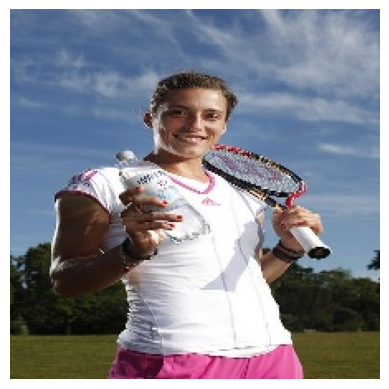

  Real Caption: زنی که یک راکت تنیس و بطری آب در دست دارد
  Generated Caption: زنی با لباس سفید در حال بازی تنیس
---------------------------------
Epoch Summary: Train Loss: 1.9002 | Val Loss: 3.4153 | BLEU-1: 0.2002 | BLEU-4: 0.0274
--- Current Learning Rate: 4e-05 ---
No improvement in validation BLEU-4 for 11 epochs.

--- Epoch 16/70 ---


Evaluating: 100%|██████████| 63/63 [03:29<00:00,  3.32s/it]



--- Random Validation Example ---


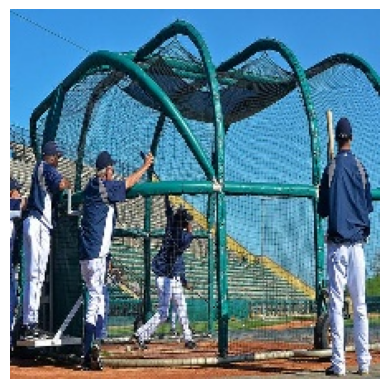

  Real Caption: مردی در قفس <unk> تمرین می کند همانطور که دیگران به آن نگاه می کنند
  Generated Caption: یک ردیف شده_است که در کنار یک <unk> در چمن پارک شده_است
---------------------------------
Epoch Summary: Train Loss: 1.8836 | Val Loss: 3.4297 | BLEU-1: 0.1976 | BLEU-4: 0.0275
--- Current Learning Rate: 8.000000000000001e-06 ---
No improvement in validation BLEU-4 for 12 epochs.
Early stopping triggered after 12 epochs with no improvement.

--- Training finished. Loading best model and running on test set... ---


Evaluating: 100%|██████████| 63/63 [03:24<00:00,  3.25s/it]



--- FINAL TEST RESULTS ---
Test Loss: 3.1201 | Test BLEU-1: 0.2092 | Test BLEU-4: 0.0313


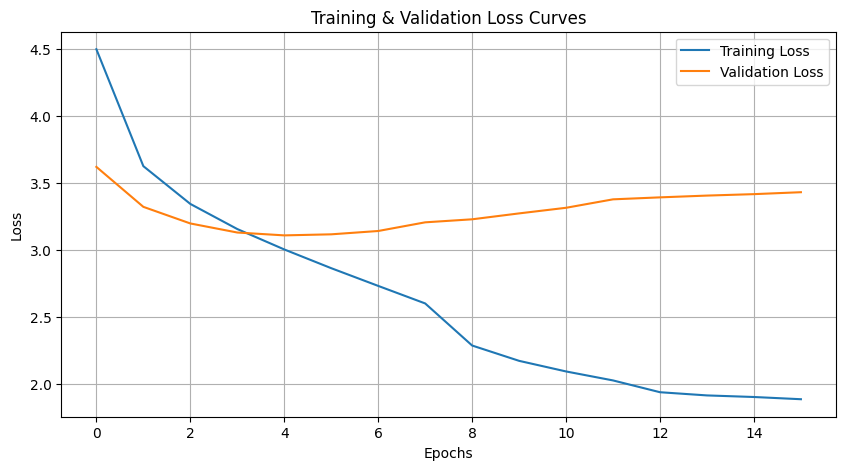

In [10]:
# --- PART 1: CONFIGURATION ---

NPZ_PATH = '/content/captions_and_vocab.npz'
CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/SDP_best_model.pth.tar'

CHECKPOINT_DIR = os.path.dirname(CHECKPOINT_PATH)

os.makedirs(CHECKPOINT_DIR, exist_ok=True)

params = {
    'num_samples': None,
    'epochs': 70,
    'batch_size': 64,
    'learning_rate': 0.001,
    'weight_decay': 0.00001,
    'lr_patience': 3,
    'early_stop_patience': 12
}

model_params = {
    'embed_dim': 256,
    'decoder_dim': 512,
    'attention_dim': 256,
    'encoder_dim': 2560,
    'dropout': 0.6,
    'finetune_encoder': False
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"--- Using device: {device} ---")


# =====================================================================================
# PART 2: DATA LOADING AND PREPARATION
# =====================================================================================
print("--- Loading preprocessed data... ---")
npz_data = np.load(NPZ_PATH, allow_pickle=True)
captions = npz_data['captions']
image_names = npz_data['image_names']
word2idx = npz_data['word2idx'].item()
idx2word = npz_data['idx2word'].item()
vocab_size = len(word2idx)

if params['num_samples'] is not None:
    print(f"--- Running in test mode: Using {params['num_samples']} samples. ---")
    captions = captions[:params['num_samples']]

indices = list(range(len(captions)))
train_indices, temp_indices = train_test_split(indices, test_size=0.2, random_state=42)
val_indices, test_indices = train_test_split(temp_indices, test_size=0.5, random_state=42)


class ImageFileDataset(Dataset):
    def __init__(self, image_dir, all_captions, all_image_names, indices, transform=None):
        self.image_dir = image_dir
        self.transform = transform


        self.indices = indices
        self.captions = [all_captions[i] for i in indices]
        self.image_names = [all_image_names[i] for i in indices]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):

        image_filename = self.image_names[idx]
        img_path = os.path.join(self.image_dir, image_filename)


        image = Image.open(img_path).convert('RGB')
        image_numpy = np.array(image)
        image_tensor = torch.FloatTensor(image_numpy).permute(2, 0, 1) / 255.0

        if self.transform:
            image_tensor = self.transform(image_tensor)

        caption = torch.LongTensor(self.captions[idx])
        caption_length = torch.LongTensor([len(caption)])

        return image_tensor, caption, caption_length

def collate_fn(batch):
    batch.sort(key=lambda x: x[2], reverse=True)
    images, captions, lengths = zip(*batch)
    images = torch.stack(images, 0)
    padded_captions = nn.utils.rnn.pad_sequence(captions, batch_first=True, padding_value=word2idx['<pad>'])
    lengths = torch.tensor(lengths, dtype=torch.long)
    return images, padded_captions, lengths

IMAGE_DIR = '/content/extracted_images/'

print("--- Creating DataLoaders from individual image files... ---")

train_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, train_indices)
val_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, val_indices)
test_dataset = ImageFileDataset(IMAGE_DIR, captions,image_names, test_indices)

train_loader = DataLoader(train_dataset, batch_size=params['batch_size'], shuffle=True, num_workers=2, pin_memory=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=params['batch_size'], shuffle=False, num_workers=2, pin_memory=True, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=params['batch_size'], shuffle=False, num_workers=2, pin_memory=True, collate_fn=collate_fn)
print("--- DataLoaders created successfully. ---")


# =====================================================================================
# PART 3: HELPER FUNCTIONS FOR TRAINING AND EVALUATION
# =====================================================================================

def train_epoch(model, loader, optimizer, criterion ):
    model.train()
    total_loss = 0.0
    for imgs, caps, caplens in tqdm(loader, desc="Training"):
        imgs, caps = imgs.to(device), caps.to(device)

        optimizer.zero_grad()

        outputs, caps_sorted, decode_lengths, _ = model(imgs, caps, caplens)
        targets = caps_sorted[:, 1:] # Targets are captions without <start> token
        # Pack outputs and targets to ignore padding in loss calculation
        packed_outputs = nn.utils.rnn.pack_padded_sequence(outputs, decode_lengths, batch_first=True).data
        packed_targets = nn.utils.rnn.pack_padded_sequence(targets, decode_lengths, batch_first=True).data
        loss = criterion(packed_outputs, packed_targets)

        loss.backward()

        # Clip gradients to prevent exploding
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)

        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)


def evaluate(model, loader, criterion, word2idx, idx2word, show_example=False):
    model.eval()
    total_loss = 0.0
    references, hypotheses = [], []

    with torch.no_grad():
        for i, (imgs, caps, caplens) in enumerate(tqdm(loader, desc="Evaluating")):
            imgs_val, caps_val = imgs.to(device), caps.to(device)

            # --- Loss Calculation (unchanged) ---
            outputs, caps_sorted, decode_lengths, _ = model(imgs_val, caps_val, caplens)
            targets = caps_sorted[:, 1:]
            packed_outputs = nn.utils.rnn.pack_padded_sequence(outputs, decode_lengths, batch_first=True).data
            packed_targets = nn.utils.rnn.pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            loss = criterion(packed_outputs, packed_targets)
            total_loss += loss.item()

            # --- BLEU Score Preparation (unchanged) ---
            # Real captions (references)
            all_caps_indices = caps.cpu().numpy()
            for cap_indices in all_caps_indices:
                real_words = [idx2word.get(idx, '<unk>') for idx in cap_indices if idx not in {word2idx['<start>'], word2idx['<end>'], word2idx['<pad>']}]
                references.append([real_words])

            # Generated captions (hypotheses)
            for img_tensor in imgs_val:
                generated_words = model.generate_caption_greedy(img_tensor.unsqueeze(0), word2idx, idx2word)
                hypotheses.append(generated_words[1:-1])

    # Calculate BLEU scores
    bleu1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0))
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    # --- CORRECTED EXAMPLE DISPLAY LOGIC ---
    if show_example:
        # Get a random index from the validation set
        random_idx_in_val_set = random.randint(0, len(val_dataset) - 1)

        # Get the corresponding image and real caption
        img_example, cap_example, _ = val_dataset[random_idx_in_val_set]

        # Move image to device for generation
        img_example_tensor = img_example.unsqueeze(0).to(device)

        # Generate a caption for THIS specific image
        generated_caption_words = model.generate_caption_greedy(img_example_tensor, word2idx, idx2word)

        # Convert real caption indices to words
        real_caption_words = [idx2word.get(idx, '<unk>') for idx in cap_example.tolist() if idx not in {word2idx['<start>'], word2idx['<end>'], word2idx['<pad>']}]

        print(f"\n--- Random Validation Example ---")
        # Permute from (C,H,W) to (H,W,C) for plotting
        plt.imshow(img_example.permute(1, 2, 0))
        plt.axis('off')
        plt.show()
        print(f"  Real Caption: {' '.join(real_caption_words)}")
        print(f"  Generated Caption: {' '.join(generated_caption_words[1:-1])}") # Exclude <start>/<end>
        print(f"---------------------------------")

    return total_loss / len(loader), bleu1, bleu4


if __name__ == '__main__':
    model = ImageCaptioningModel(vocab_size=vocab_size, **model_params).to(device)
    criterion = nn.CrossEntropyLoss(ignore_index=word2idx['<pad>'])
    optimizer = torch.optim.Adam(model.parameters(), lr=params['learning_rate'], weight_decay=params['weight_decay'])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=params['lr_patience'], factor=0.2, verbose=True)

    start_epoch = 0
    best_bleu4 = 0.0
    train_losses, val_losses = [], []

    if os.path.exists(CHECKPOINT_PATH):
        print(f"--- Checkpoint found at '{CHECKPOINT_PATH}'! Resuming training... ---")
        checkpoint = torch.load(CHECKPOINT_PATH)

        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        start_epoch = checkpoint['epoch']
        best_bleu4 = checkpoint['best_bleu4']
        train_losses = checkpoint['train_losses']
        val_losses = checkpoint['val_losses']

        print(f"--- Resuming from epoch {start_epoch}. Best BLEU-4 so far: {best_bleu4:.4f} ---")
    else:
        print(f"--- No checkpoint found at '{CHECKPOINT_PATH}'. Starting from scratch. ---")


    epochs_no_improve = 0
    print("\n--- Starting Training ---")

    for epoch in range(start_epoch, params['epochs']):
        print(f"\n--- Epoch {epoch+1}/{params['epochs']} ---")

        train_loss = train_epoch(model, train_loader, optimizer, criterion)
        val_loss, bleu1, bleu4 = evaluate(model, val_loader, criterion, word2idx, idx2word, show_example=True)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        scheduler.step(bleu4)
        print(f"Epoch Summary: Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | BLEU-1: {bleu1:.4f} | BLEU-4: {bleu4:.4f}")
        current_lr = optimizer.param_groups[0]['lr']
        print(f"--- Current Learning Rate: {current_lr} ---")
        is_best = bleu4 > best_bleu4
        if is_best:
            best_bleu4 = bleu4
            epochs_no_improve = 0

            print(f"New best model saved with BLEU-4: {best_bleu4:.4f}")

            state = {
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'best_bleu4': best_bleu4,
                'train_losses': train_losses,
                'val_losses': val_losses
            }
            torch.save(state, CHECKPOINT_PATH)

        else:
            epochs_no_improve += 1
            print(f"No improvement in validation BLEU-4 for {epochs_no_improve} epochs.")

        if epochs_no_improve >= params['early_stop_patience']:
            print(f"Early stopping triggered after {params['early_stop_patience']} epochs with no improvement.")
            break


    # --- Final Test Evaluation ---
    print("\n--- Training finished. Loading best model and running on test set... ---")

    checkpoint = torch.load(CHECKPOINT_PATH)

    model.load_state_dict(checkpoint['model_state_dict'])

    test_loss, test_bleu1, test_bleu4 = evaluate(model, test_loader, criterion, word2idx, idx2word)
    print(f"\n--- FINAL TEST RESULTS ---")
    print(f"Test Loss: {test_loss:.4f} | Test BLEU-1: {test_bleu1:.4f} | Test BLEU-4: {test_bleu4:.4f}")

    # --- Plotting Loss Curves ---
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training & Validation Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

--- Step 1: Setting up paths and loading the trained model... ---
✅ Model loaded successfully from checkpoint.

--- Step 2: Generating and displaying 3 random samples... ---


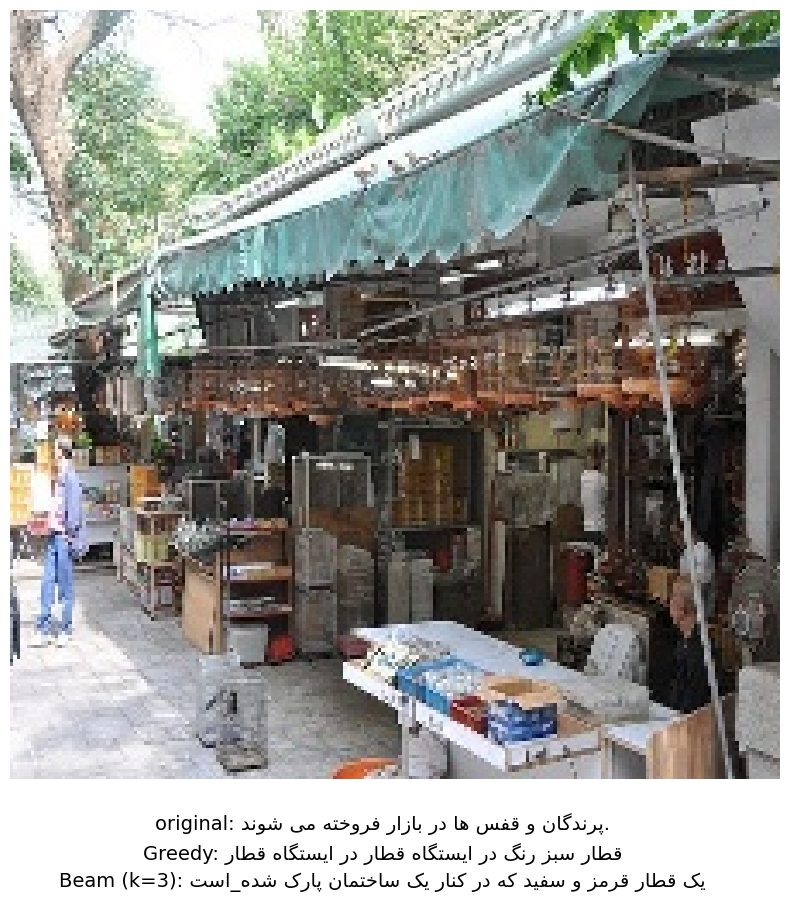

--------------------------------------------------------------------------------


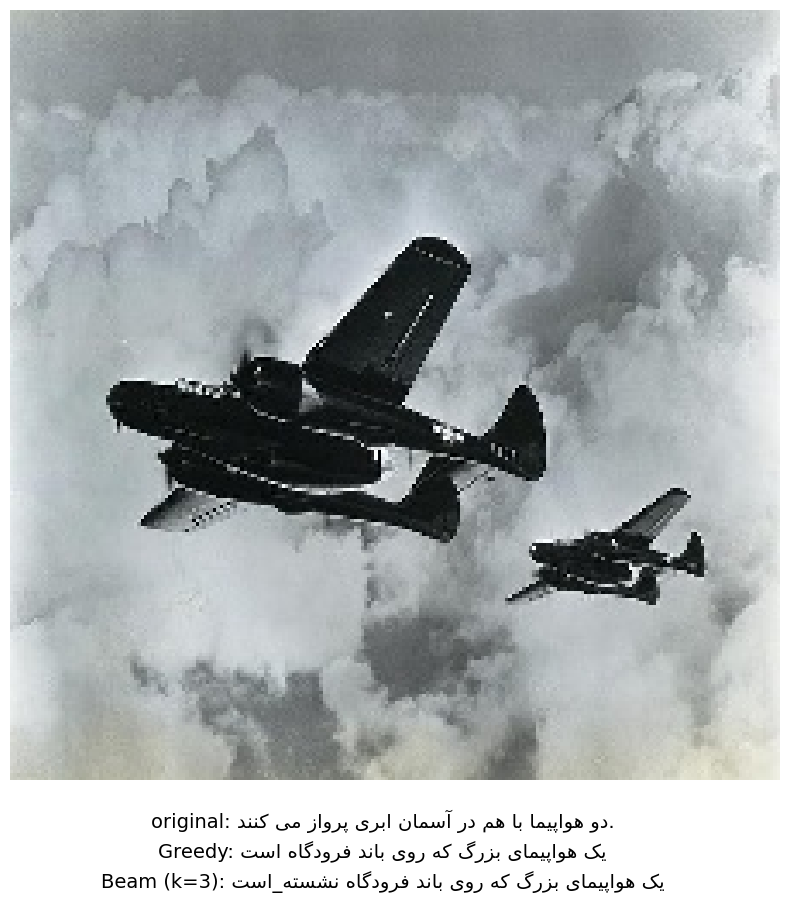

--------------------------------------------------------------------------------


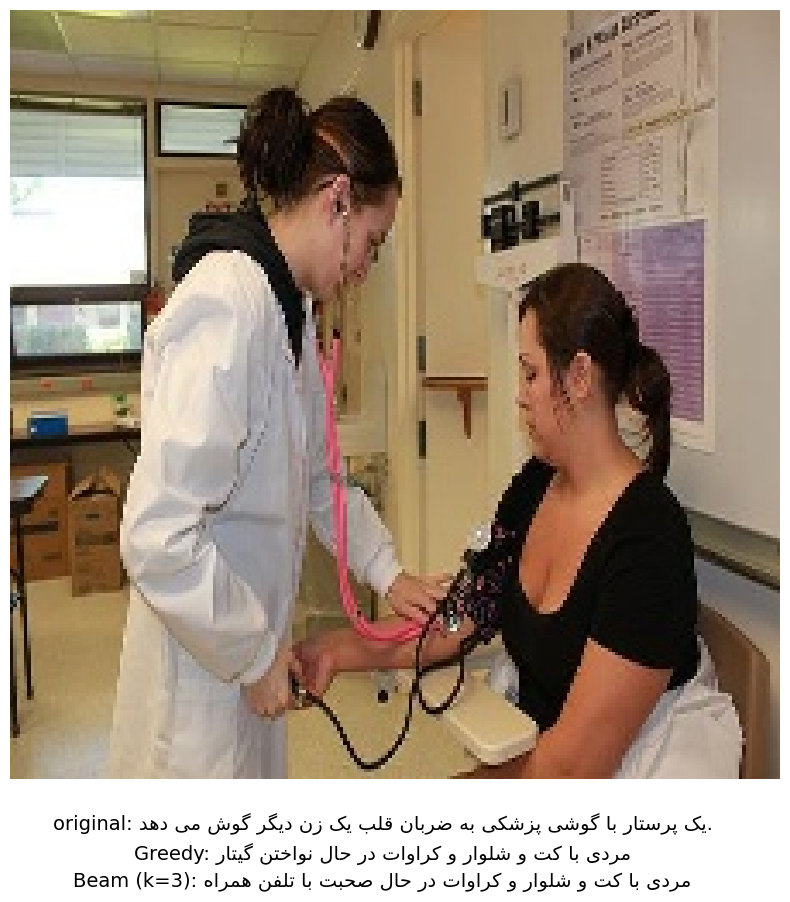

--------------------------------------------------------------------------------


In [13]:
# ==============================================================================
# SCRIPT TO VISUALIZE AND COMPARE MODEL PREDICTIONS
# ==============================================================================


# --- 1. Setup: Define Paths and Load Model ---

print("--- Step 1: Setting up paths and loading the trained model... ---")

# --- Paths ---
# Data paths are local to the Colab runtime
LOCAL_NPZ_PATH = '/content/captions_and_vocab.npz'
LOCAL_IMAGE_DIR = '/content/extracted_images/'

# Checkpoint path is on Google Drive for persistence
# ⚠️ Make sure this path points to your saved model
CHECKPOINT_PATH = '/content/drive/MyDrive/ImageCaptioning/SDP_best_model.pth.tar'

# --- Load Vocabulary and File Lists ---
try:
    npz_data = np.load(LOCAL_NPZ_PATH, allow_pickle=True)
    word2idx = npz_data['word2idx'].item()
    idx2word = npz_data['idx2word'].item()
    image_names = npz_data['image_names']
    # Load original captions to display ground truth
    # We assume the original captions are also in the NPZ, if not, load from CSV
    original_captions_df = pd.read_csv('/content/dataset/dataset/data.csv')
    image_name_to_caption = pd.Series(original_captions_df.text.values, index=original_captions_df.image).to_dict()

except FileNotFoundError:
    print(f"❌ ERROR: Could not find data files. Please run the preprocessing script first.")
    raise

# --- Build and Load Model ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Model parameters should be the same as during training
model_params = {
    'embed_dim': 256,
    'decoder_dim': 512,
    'attention_dim': 256,
    'encoder_dim': 2560,
    'dropout': 0.5,
    'finetune_encoder': False
}
vocab_size = len(word2idx)

# Instantiate the model
model = ImageCaptioningModel(vocab_size=vocab_size, **model_params).to(device)

# Load the trained weights from the checkpoint
try:
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval() # Set model to evaluation mode
    print("✅ Model loaded successfully from checkpoint.")
except FileNotFoundError:
    print(f"❌ ERROR: Checkpoint not found at '{CHECKPOINT_PATH}'")
    raise


# --- 2. Helper function to preprocess a single image for inference ---
def preprocess_for_inference(image_path, target_size=(224, 224)):
    """
    Loads and preprocesses a single image to be fed into the model.
    This must match the preprocessing used in your training script.
    """
    image = Image.open(image_path).convert('RGB')

    # In your last script, you resized by squashing, so we do the same here.
    image = image.resize(target_size)

    image_numpy = np.array(image)
    # Normalize to [0, 1] and create tensor
    image_tensor = torch.FloatTensor(image_numpy).permute(2, 0, 1) / 255.0

    # Add batch dimension and send to device
    return image_tensor.unsqueeze(0).to(device)


# --- 3. Main Visualization Function ---
def visualize_predictions(num_samples=3):
    """
    Selects random samples and displays the image with all three captions.
    """
    print(f"\n--- Step 2: Generating and displaying {num_samples} random samples... ---")

    # Get random indices from the list of processed images
    random_indices = random.sample(range(len(image_names)), num_samples)

    # Use a font that supports Persian characters
    plt.rcParams['font.family'] = 'DejaVu Sans'

    for i, idx in enumerate(random_indices):
        image_filename = image_names[idx]
        image_path = os.path.join(LOCAL_IMAGE_DIR, image_filename)

        # --- Get Data ---
        # Get original ("ground truth") caption
        ground_truth_caption = image_name_to_caption.get(image_filename, "Caption not found.")

        # Preprocess the image for the model
        input_tensor = preprocess_for_inference(image_path)

        # --- Generate Captions ---
        greedy_words = model.generate_caption_greedy(input_tensor, word2idx, idx2word)
        beam_words = model.generate_caption_beam_search(input_tensor, word2idx, idx2word, beam_size=3)

        # --- Clean and Format Text for Display ---
        # Remove <start> and <end> tokens
        greedy_caption = ' '.join(greedy_words[1:-1])
        beam_caption = ' '.join(beam_words[1:-1])

        # Reshape for correct display in Matplotlib
        gt_display = get_display(arabic_reshaper.reshape("original: " + ground_truth_caption))
        greedy_display = get_display(arabic_reshaper.reshape("Greedy: " + greedy_caption))
        beam_display = get_display(arabic_reshaper.reshape("Beam (k=3): " + beam_caption))

        # --- Plotting ---
        display_image = Image.open(image_path)

        plt.figure(figsize=(10, 10))
        plt.imshow(display_image)
        plt.axis('off')

        # Add the captions as text below the image
        plt.figtext(0.5, 0.01, f"{gt_display}\n{greedy_display}\n{beam_display}",
                    ha="center", fontsize=14, wrap=True, linespacing=1.5)

        plt.show()
        print("-" * 80)

# --- 4. Run the visualization ---
visualize_predictions(num_samples=3)